In [1]:
from pathlib import Path

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.offline
from plotly.subplots import make_subplots
import plotly.express as px
from sklearn.preprocessing import MinMaxScaler

from pptoolbox.platform import preprocess, WAVELENGTHS_3NM_V1
from pptoolbox.preprocessing import SNV, MSC, SavitzkyGolay, Detrend
from pptoolbox.visualization import (plot_spectra, plot_loadings, plot_scree, fit_pca,
                                               generate_pc_df, plot_svp, initialize_theme,spectral_vector_properties)

from sklearn.feature_selection import f_classif, mutual_info_classif, chi2

# plotly.offline.init_notebook_mode()
# qualitative_cmap, diverging_cmap, light_cmap = initialize_theme()

# import data

In [2]:
datafolder_path = Path ("../data/")
raw_csv = datafolder_path / "raw/spectra_250204.csv"
raw_df = pd.read_csv(raw_csv)

label_csv = datafolder_path / "processed/label_df_250204.csv"
label_df = pd.read_csv(label_csv)

raw_df.shape,label_df.shape


((200, 25), (50, 8))

In [3]:
label_df["train_test"] = np.where(label_df["train_test"] == "none", "test", label_df["train_test"])
label_df = label_df.drop(columns=["lot_name"])

In [4]:
raw_df_og = raw_df.copy(deep=True)
label_df_og = label_df.copy(deep=True)

# preprocess lots

In [5]:
raw_df, label_df = preprocess(raw_df, label_df, wavelengths=WAVELENGTHS_3NM_V1)

raw_df.shape, label_df.shape

((200, 191), (200, 6))

In [6]:
label_df.columns

Index(['Brix', 'T440', 'T625', 'TTA', 'Turbidity', 'train_test'], dtype='object')

In [7]:
label_type_list = ['reg']*5 + ['clf']

param_label_map = dict(zip(label_df.columns, label_type_list))

#remove Preservative from dictionary
param_label_map

{'Brix': 'reg',
 'T440': 'reg',
 'T625': 'reg',
 'TTA': 'reg',
 'Turbidity': 'reg',
 'train_test': 'clf'}

# filter data

In [8]:
selections = [
    'AJC'
]

# Check for Outliers

In [9]:
cmap=sns.color_palette()
PREPROCESSING = 'No Preprocessing'

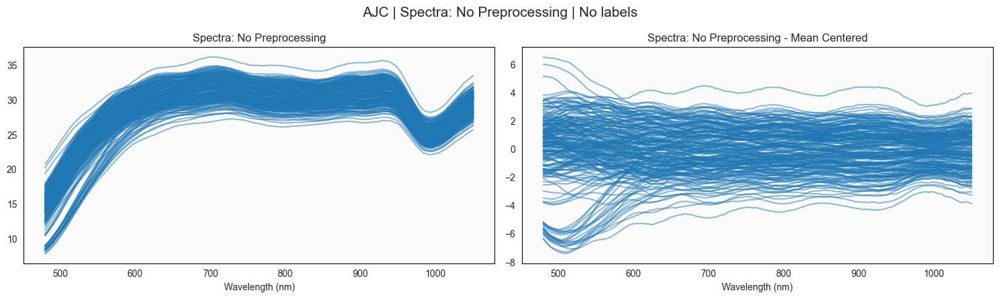

In [10]:
for selection in selections:

    output_dir = Path(f"../data/visualisation/{selection}/")
    output_dir.mkdir(exist_ok=True, parents=True)

    # mask = label_df['Preservative'] == selection
    # selected_df = raw_df.loc[mask,:]
    selected_df = raw_df
    SAMPLE_TYPE = f'{selection}'

    plot_spectra(selected_df, labels=None,
                spec_prep=PREPROCESSING,
                sample_type=SAMPLE_TYPE,
                cmap=cmap);

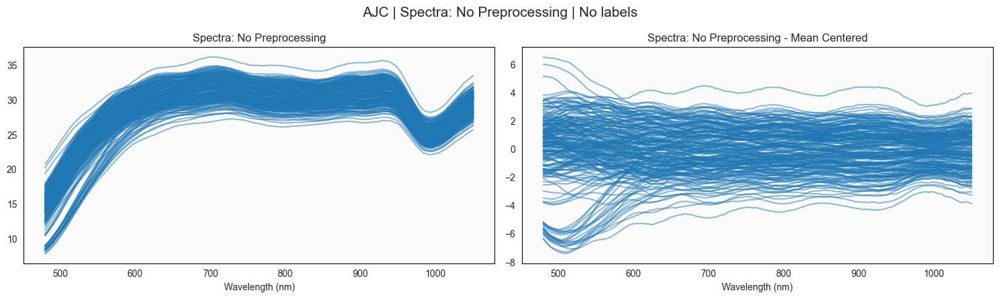

In [11]:
for selection in selections:

    output_dir = Path(f"../data/visualisation/{selection}/")
    output_dir.mkdir(exist_ok=True, parents=True)

    # mask = label_df['Preservative'] == selection
    # selected_df = raw_df.loc[mask,:]
    selected_df = raw_df
    SAMPLE_TYPE = f'{selection}'

    plot_spectra(selected_df, labels=None,
                spec_prep=PREPROCESSING,
                sample_type=SAMPLE_TYPE,
                cmap=cmap);

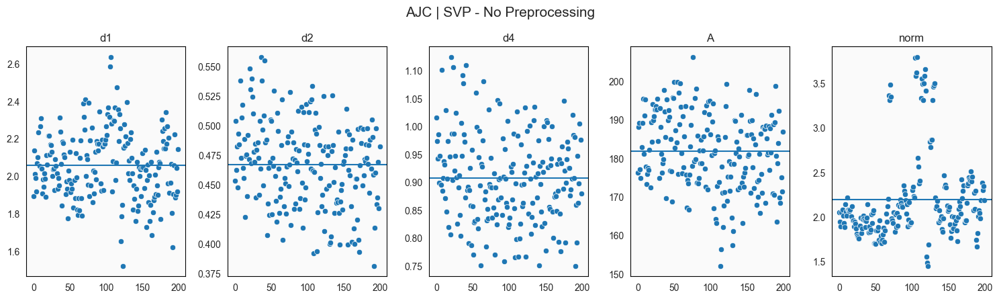

In [12]:
for selection in selections:
    
    # mask = label_df['Preservative'] == selection
    # selected_df = raw_df.loc[mask,:]
    selected_df = raw_df
    SAMPLE_TYPE = f'{selection}'
    plot_svp(selected_df, title=f'{selection} | SVP - No Preprocessing')
    plt.show()
    plt.close()

## identify outlier samples

5 and 8 are good cutoffs for both.

In [13]:
# for selection in selections:

#     output_dir = Path(f"../data/visualisation/{selection}/")
#     output_dir.mkdir(exist_ok=True, parents=True)

#     # mask = label_df['Preservative'] == selection
#     # selected_df = raw_df.loc[mask,:]
#     selected_df = raw_df

#     plot_svp(selected_df, title=f'{selection} | SVP - No Preprocessing')

#     svp_arr = spectral_vector_properties(selected_df, True)

#     #metrics cutoff
#     metrics = {
#         0 : 'd1',
#         1 : 'd2',
#         2 : 'd4',
#         3 : 'A',
#         4 : 'norm'
#     }
#     choice = 4
#     maxval = 8
#     minval = 5

#     norm_data = svp_arr[metrics[choice]]
#     norm_ax = plt.gcf().axes[choice]

#     for idx in range(len(norm_data)):
#         if norm_data.iloc[idx] < minval or norm_data.iloc[idx] > maxval:  
#             norm_ax.text(idx, norm_data.iloc[idx], norm_data.index[idx], 
#                         fontsize=10, color='red')
            
#     # ### only for Chalk
#     # if selection == 'Chalk':
#     #     norm_data = svp_arr[metrics[0]]
#     #     norm_ax = plt.gcf().axes[0]
#     #     for idx in range(len(norm_data)):
#     #         if norm_data.iloc[idx] > 1.4:  
#     #             norm_ax.text(idx, norm_data.iloc[idx], norm_data.index[idx], 
#     #                         fontsize=10, color='red') 

#     plt.savefig(output_dir / f"{selection}_svp.png")
#     plt.show()
#     plt.close()

In [14]:
# for selection in selections:
#     print(selection)
#     mask = label_df['Preservative'] == selection
#     selected_df = raw_df.loc[mask,:]

#     svp_arr = spectral_vector_properties(selected_df, True)

#     anomalous_mask = (svp_arr[metrics[choice]] < minval) | (svp_arr[metrics[choice]] > maxval)

#     anomalous_df = svp_arr.loc[anomalous_mask,:]

#     check_df = selected_df.loc[anomalous_mask,:]

#     check_df = check_df.reset_index()

#     check_df_labels = check_df[['lot_id']]
#     check_df_labels['anomalous'] = check_df['lot_id']
#     check_df_labels= check_df_labels.set_index('lot_id')

#     check_df = check_df.set_index('lot_id')

#     SAMPLE_TYPE = f'{selection}'

#     plot_spectra(check_df, labels=check_df_labels,
#                 spec_prep=PREPROCESSING,
#                 sample_type=SAMPLE_TYPE,
#                 cmap=cmap)
#     plt.show()
#     plt.close()

## filter outliers

In [15]:
# anomalous_mask = (svp_arr[metrics[choice]] < minval) | (svp_arr[metrics[choice]] > maxval)
# len(anomalous_mask)

In [16]:
# cleaned_spectra = {}
# combined_input_export = pd.DataFrame()
# combined_label_export = pd.DataFrame()

# for selection in selections:
#     print(selection)
#     mask = label_df['Preservative'] == selection
#     selected_df = raw_df.loc[mask,:]
#     selected_labels = label_df.loc[mask,:]
#     print(selected_df.shape, selected_labels.shape)

#     svp_arr = spectral_vector_properties(selected_df, True)

#     anomalous_mask = (svp_arr[metrics[choice]] < minval) | (svp_arr[metrics[choice]] > maxval)
#     print(f'Number of anomalous specimens: {anomalous_mask.sum()}')
#     print(len(anomalous_mask))
    
#     temp = raw_df_og.copy(deep=True)
#     temp = temp[temp['Preservative'] == selection]
#     temp = temp.set_index('lot_id')
#     print(temp.shape)
#     print(np.unique(anomalous_mask.index==temp.index,return_counts=True))

#     cleaned_input_export = temp.loc[~anomalous_mask,:]

#     combined_input_export = pd.concat([combined_input_export, cleaned_input_export], axis=0)

#     cleaned_df = selected_df.loc[~anomalous_mask,:]
#     cleaned_labels = selected_labels.loc[~anomalous_mask,:]

#     cleaned_spectra  = {
#         **cleaned_spectra,
#         f'{selection}_spectra': cleaned_df,
#         f'{selection}_label': cleaned_labels
#     }

# output_dir = Path(f"../data/processed/")
# output_dir.mkdir(exist_ok=True, parents=True)
# # combined_input_export.to_csv(output_dir/"cleaned_input_full.csv")

# print(cleaned_spectra.keys())

# for key in cleaned_spectra.keys():
#     print(key, cleaned_spectra[key].shape)    

# no outliers

In [19]:
cleaned_spectra = {}
combined_input_export = pd.DataFrame()
combined_label_export = pd.DataFrame()

for selection in selections:
    # mask = label_df['Preservative'] == selection
    # selected_df = raw_df.loc[mask,:]
    selected_df = raw_df
    # selected_labels = label_df.loc[mask,:]
    selected_labels = label_df
    print(selected_df.shape, selected_labels.shape)

    svp_arr = spectral_vector_properties(selected_df, True)

    # anomalous_mask = (svp_arr[metrics[choice]] < minval) | (svp_arr[metrics[choice]] > maxval)
    # print(f'Number of anomalous specimens: {anomalous_mask.sum()}')
    # print(len(anomalous_mask))
    
    # temp = raw_df_og.copy(deep=True)
    # temp = temp[temp['Preservative'] == selection]
    # temp = temp.set_index('lot_id')
    # print(temp.shape)
    # print(np.unique(anomalous_mask.index==temp.index,return_counts=True))

    # cleaned_input_export = temp.loc[~anomalous_mask,:]
    cleaned_input_export = raw_df_og.copy(deep=True)

    combined_input_export = pd.concat([combined_input_export, cleaned_input_export], axis=0)

    # cleaned_df = selected_df.loc[~anomalous_mask,:]
    # cleaned_labels = selected_labels.loc[~anomalous_mask,:]
    cleaned_df = selected_df
    cleaned_labels = selected_labels

    cleaned_spectra  = {
        **cleaned_spectra,
        f'{selection}_spectra': cleaned_df,
        f'{selection}_label': cleaned_labels
    }

output_dir = Path(f"../data/processed/")
output_dir.mkdir(exist_ok=True, parents=True)
# combined_input_export.to_csv(output_dir/"cleaned_input.csv")

print(cleaned_spectra.keys())

for key in cleaned_spectra.keys():
    print(key, cleaned_spectra[key].shape)    

(200, 191) (200, 6)
dict_keys(['AJC_spectra', 'AJC_label'])
AJC_spectra (200, 191)
AJC_label (200, 6)


Assigned AJC_spectra to spectra_df
Assigned AJC_label to label_df


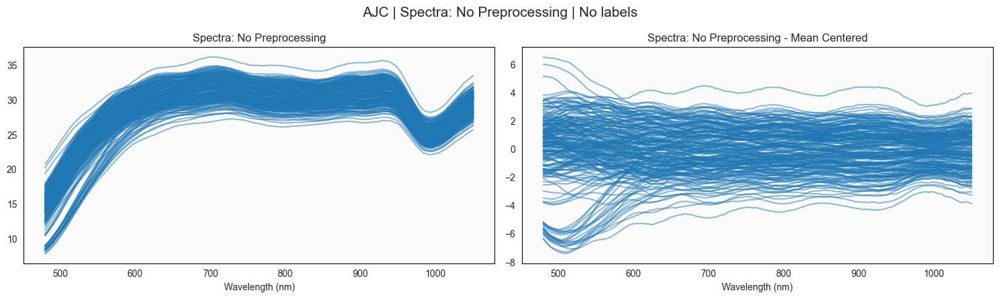

In [20]:
data_split = ['spectra', 'label']
PREPROCESSING = 'No Preprocessing'

for selection in selections:

    for split in data_split:
        key = f'{selection}_{split}'
        if key in cleaned_spectra:
            if split == 'spectra':
                selected_df = cleaned_spectra[key]
            elif split == 'label':
                selected_labels = cleaned_spectra[key]
            print(f'Assigned {key} to {split}_df')
    
    SAMPLE_TYPE = f'{selection}'

    plot_spectra(selected_df, labels=None,
                spec_prep=PREPROCESSING,
                sample_type=SAMPLE_TYPE,
                cmap=cmap);
    
    # plt.savefig(output_dir / f"{selection}_spectra_noLabel.png", bbox_inches='tight')
    plt.show()
    plt.close()

# No Preprocessing

In [21]:
data_split = ['spectra', 'label']
spectra_meta = {}
PREPROCESSING = 'No Preprocessing'

Assigned AJC_spectra to spectra_df
Assigned AJC_label to label_df
(200, 191) (200, 6)


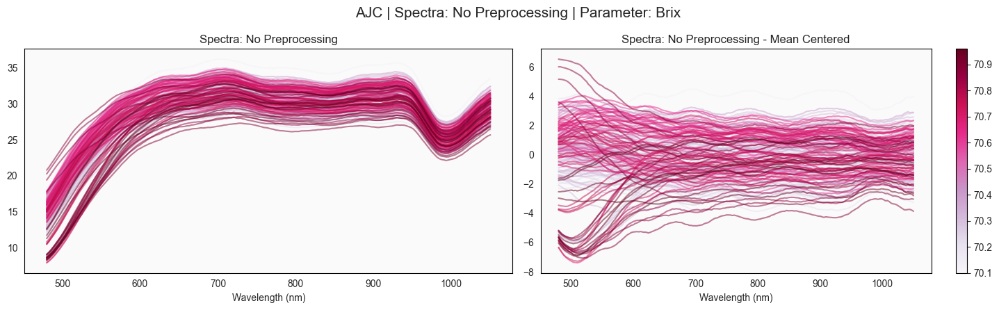

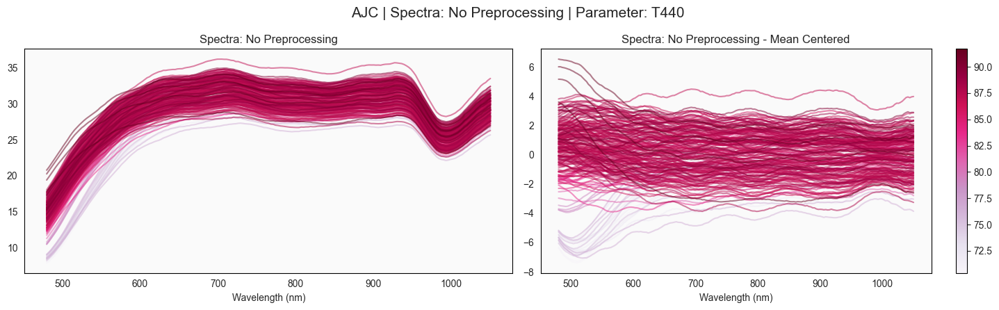

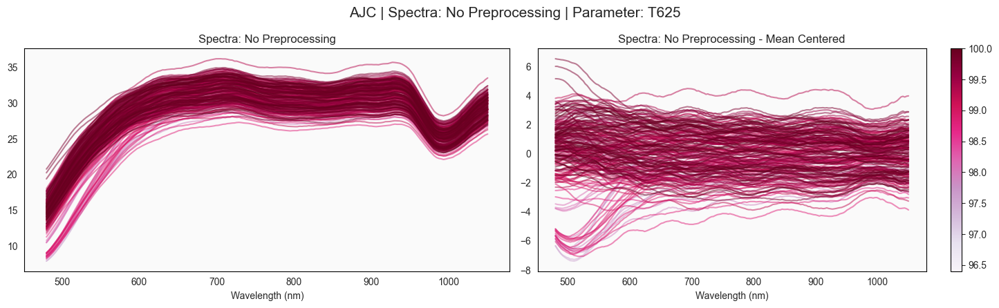

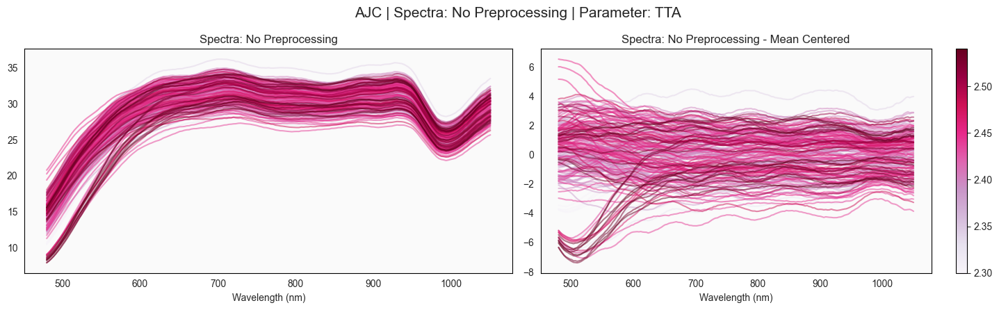

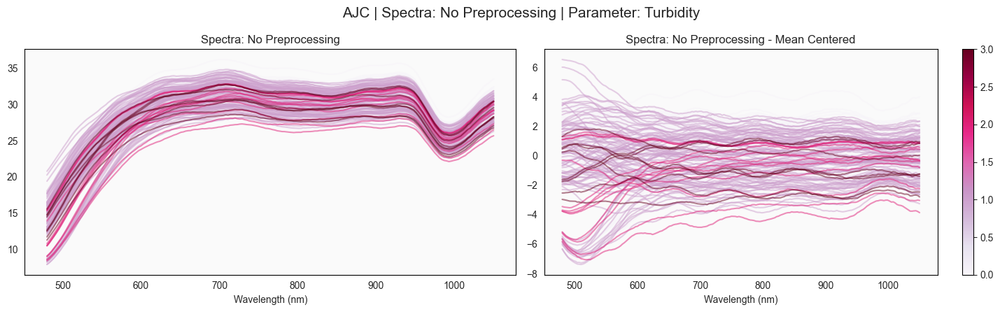

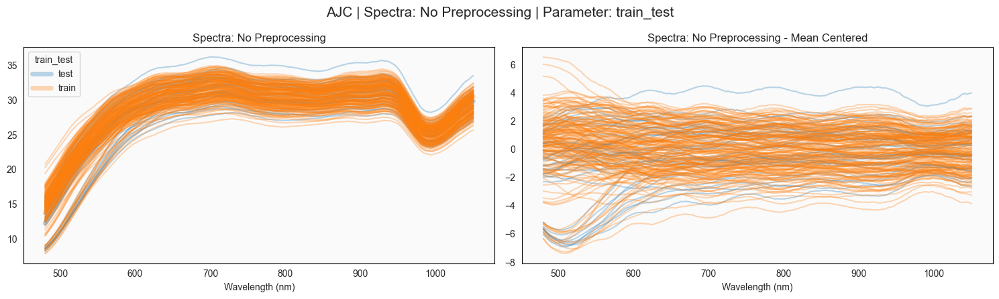

In [23]:
for selection in selections:

    output_dir = Path(f"../data/visualisation/{selection}/{PREPROCESSING}")
    output_dir.mkdir(exist_ok=True, parents=True)

    SAMPLE_TYPE = f'{selection}'

    for split in data_split:
        key = f'{selection}_{split}'
        if key in cleaned_spectra:
            if split == 'spectra':
                selected_df = cleaned_spectra[key]
            elif split == 'label':
                selected_labels = cleaned_spectra[key]
            print(f'Assigned {key} to {split}_df')
    
    print(selected_df.shape, selected_labels.shape)

    plot_df = selected_df.copy()

    spectra_meta = {
        **spectra_meta,
        f'{selection}_plot_df' : plot_df
    }

    for param, label_type in param_label_map.items():
        plot_spectra(plot_df, labels=selected_labels[[param]],
                    label_type=label_type,
                    spec_prep=PREPROCESSING,
                    sample_type=SAMPLE_TYPE,
                    cmap=cmap)
        
        # plt.savefig(output_dir / f"{selection}_spectra_{param}.png", bbox_inches='tight')
        plt.show()
        plt.close()

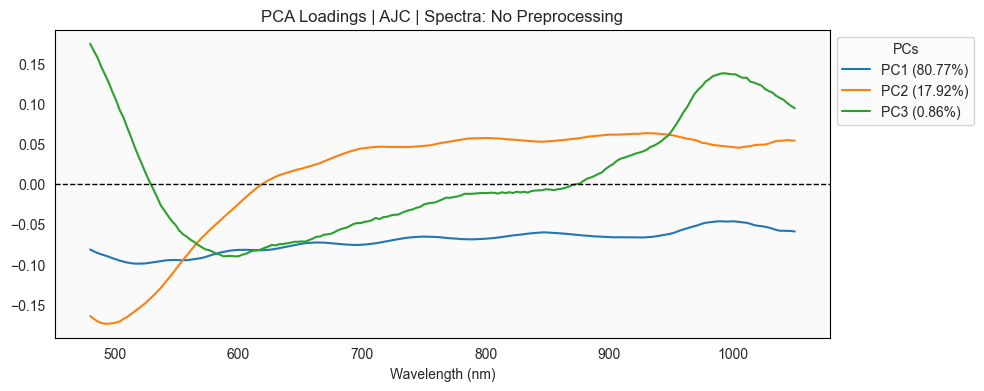

Total Explained Variance: 99.547% 
    Number of Components: 3


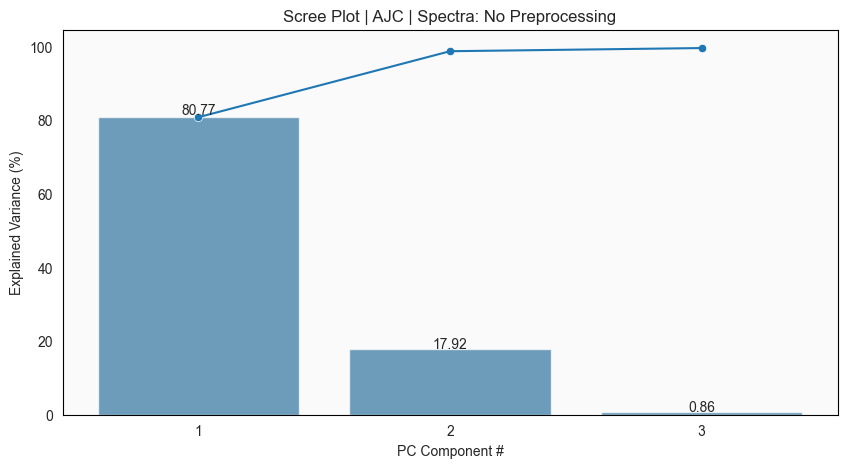

In [25]:
N_COMP = 0.99
RANDOM_STATE = 42

for selection in selections:

    output_dir = Path(f"../data/visualisation/{selection}/{PREPROCESSING}")
    output_dir.mkdir(exist_ok=True, parents=True)
    
    SAMPLE_TYPE = f'{selection}'

    plot_df = spectra_meta[f'{selection}_plot_df']

    fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)

    spectra_meta = {
        **spectra_meta,
        f'{selection}_fitted_pc' : fitted_pc,
        f'{selection}_pc_labels' : pc_labels,
        }

    fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
                            spec_prep=PREPROCESSING, 
                            sample_type=SAMPLE_TYPE)
    
    plt.savefig(output_dir / f"{selection}_pca_loadings.png", bbox_inches='tight')
    plt.show()
    plt.close()

    fig1, ax1 = plot_scree(fitted_pc,
                        spec_prep=PREPROCESSING, 
                        sample_type=SAMPLE_TYPE)
    print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
    Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

    plt.savefig(output_dir / f"{selection}_scree_plot.png", bbox_inches='tight')
    plt.show()
    plt.close()

Assigned AJC_spectra to spectra_df
Assigned AJC_label to label_df
(200, 191) (200, 6)


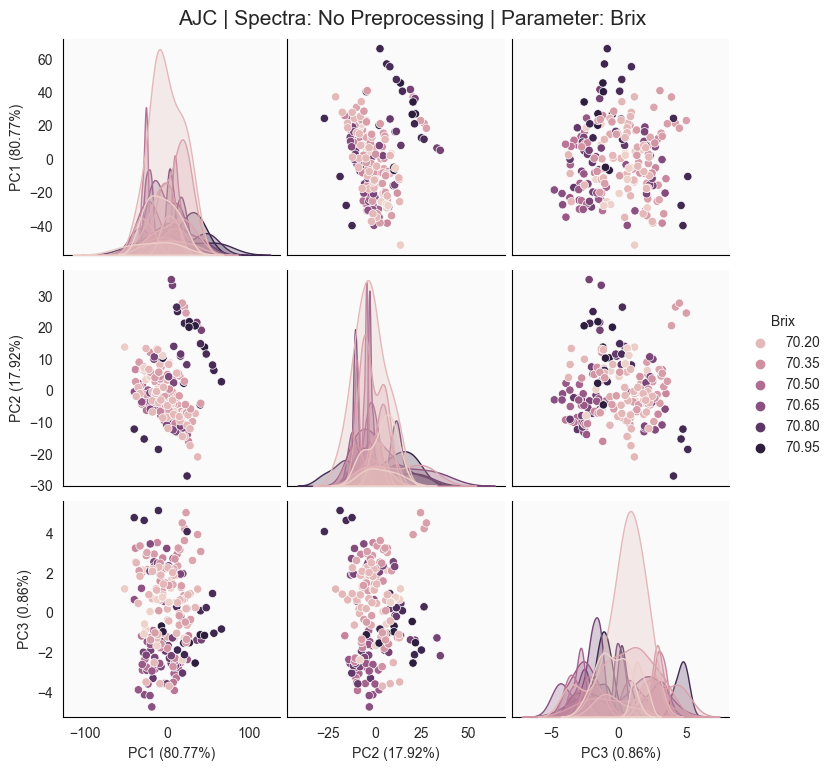

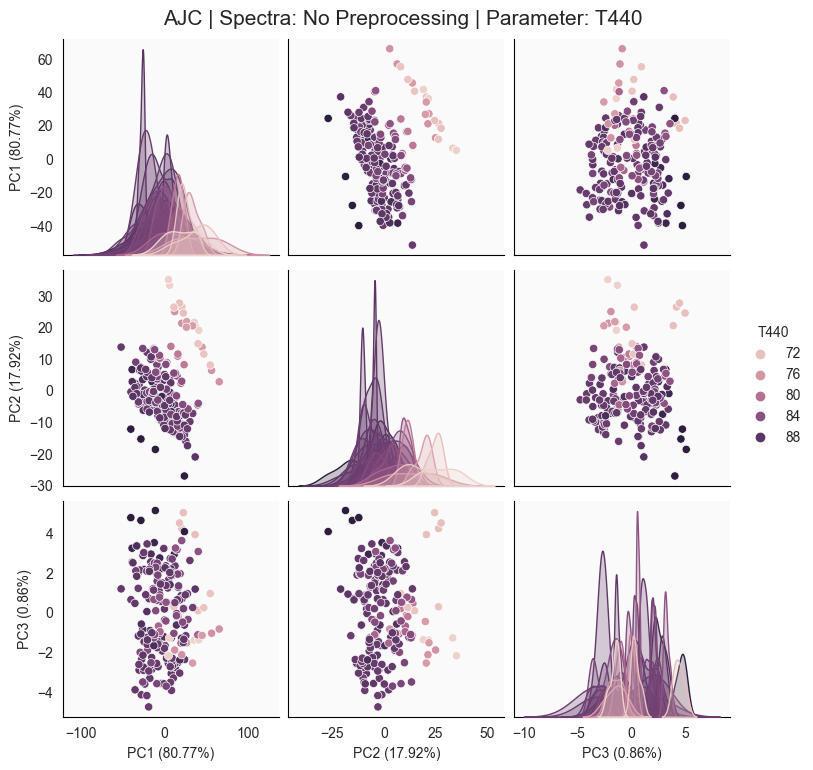

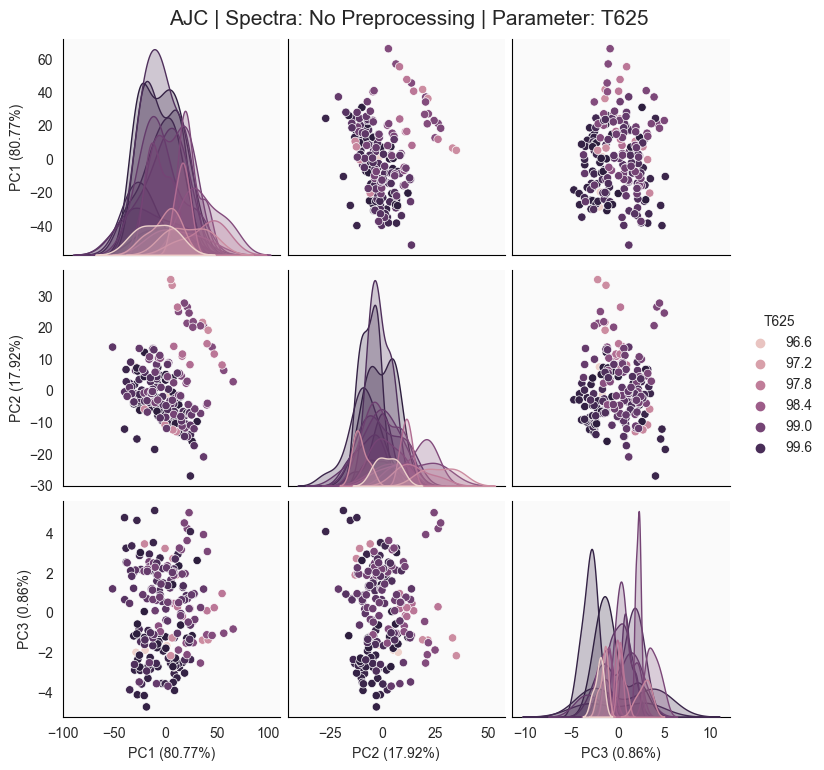

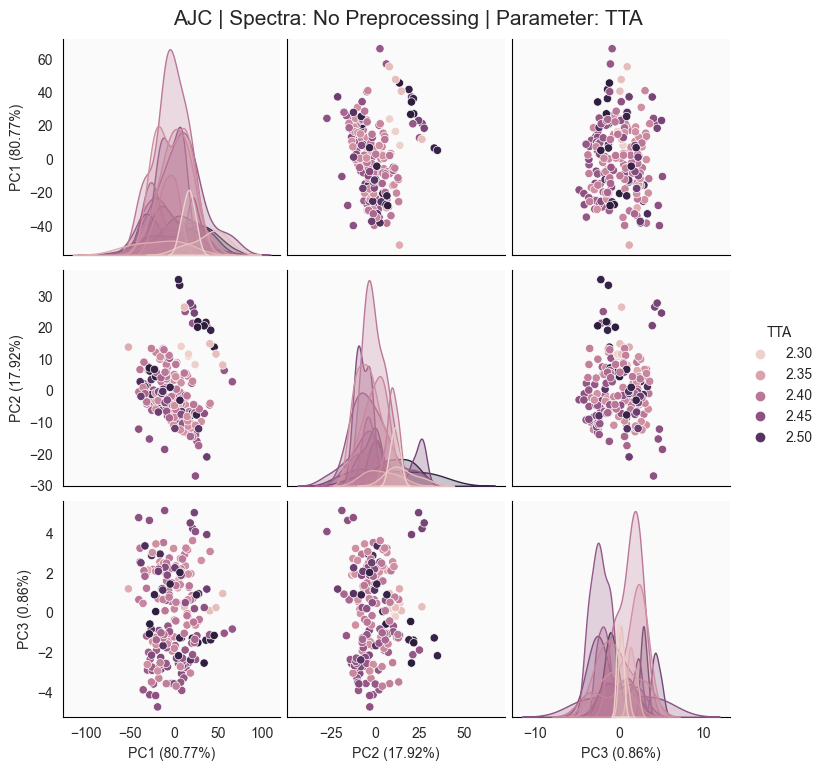

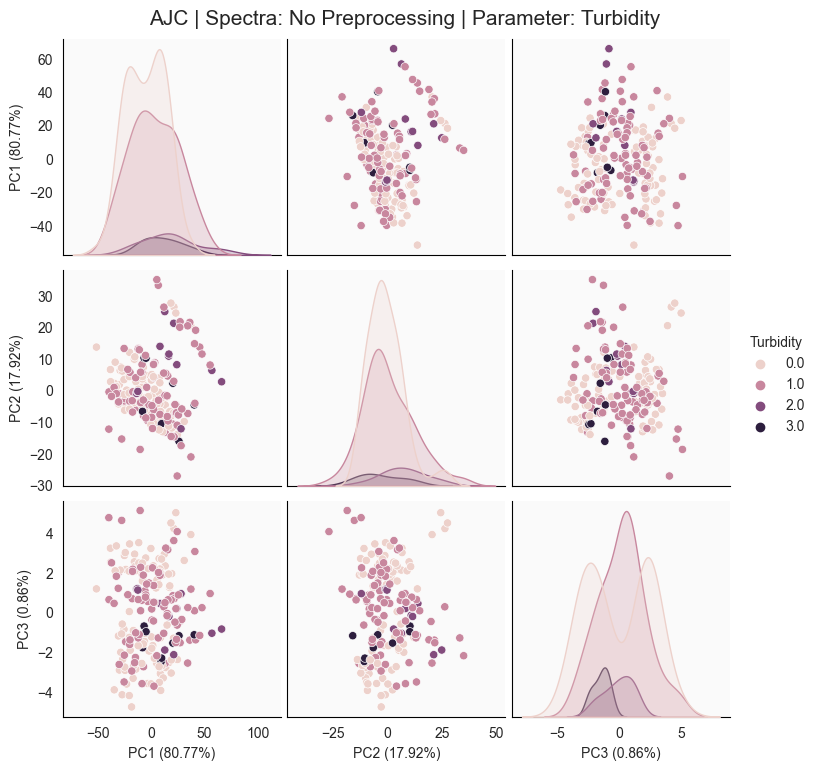

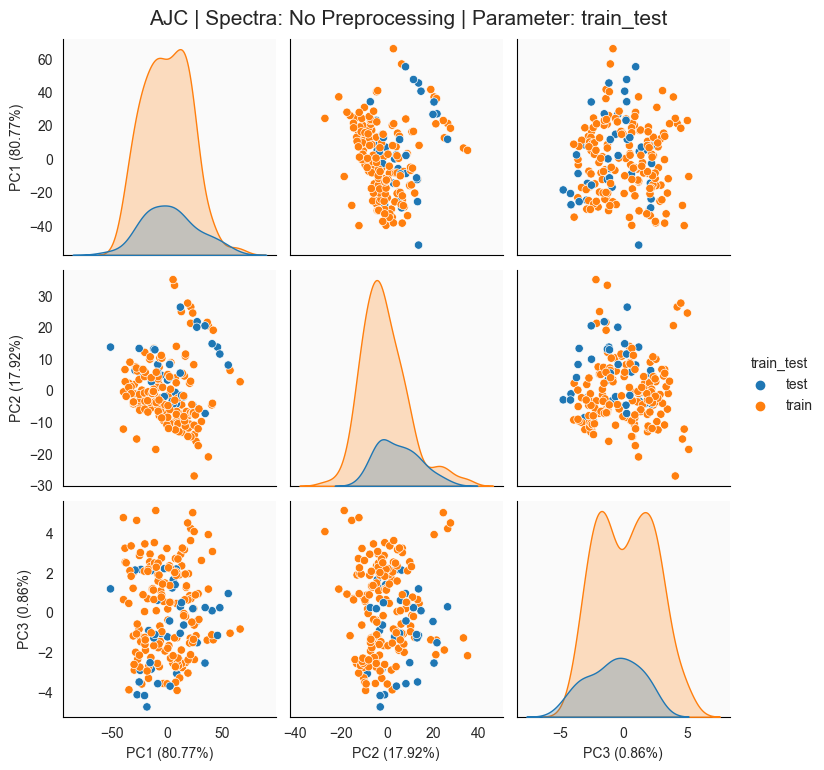

In [26]:
for selection in selections:
    SAMPLE_TYPE = f'{selection}'

    output_dir = Path(f"../data/visualisation/{selection}/{PREPROCESSING}")
    output_dir.mkdir(exist_ok=True, parents=True)
    
    for split in data_split:
        key = f'{selection}_{split}'
        if key in cleaned_spectra:
            if split == 'spectra':
                selected_df = cleaned_spectra[key]
            elif split == 'label':
                selected_labels = cleaned_spectra[key]
            print(f'Assigned {key} to {split}_df')
    
    plot_df = spectra_meta[f'{selection}_plot_df']
    fitted_pc = spectra_meta[f'{selection}_fitted_pc']
    pc_labels = spectra_meta[f'{selection}_pc_labels']

    print(plot_df.shape, selected_labels.shape)

    for param in param_label_map.keys():
        pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=selected_labels[[param]])
        sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
        plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

        plt.savefig(output_dir / f"{selection}_pca_{param}.png", bbox_inches='tight')
        plt.show()
        plt.close()

In [30]:
# fig = make_subplots(rows=3, cols= 2, 
#                     subplot_titles=['F Test Spectra', 'F Test PCA', 
#                                     'Mutual Info Spectra', 'Mutual Info PCA',
#                                     'Chi2 Spectra', 'Chi2 PCA'],
#                     specs=[[{'secondary_y': True}, {'secondary_y': True}],
#                            [{'secondary_y': False}, {'secondary_y': False}],
#                            [{'secondary_y': True}, {'secondary_y': True}]],
#                     horizontal_spacing=0.15,
#                     vertical_spacing=0.1)

# title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
# colors = px.colors.qualitative.Plotly
# pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
# n_comp = fitted_pc.n_components_

# for i, param in enumerate(param_label_map.keys()):
#     try:
#         f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
#         f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
#         mms = MinMaxScaler()
#         scaled_spec = mms.fit_transform(plot_df)
#         scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
#         mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
#         mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
#         chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
#         chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
#                        opacity=0.8, showlegend=False),
#                        secondary_y=False,row=2, col=1)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
#                        showlegend=False, opacity=0.8),
#                     secondary_y=False, row=2, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=2)
        
#     except:
#         pass

# # Add figure title
# fig.update_layout(title_text=title, height=1400, width=1400)
# fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
# fig.update_xaxes(title_text="No. of PCs", col=2)

# # Set y-axes titles
# fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
# fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
# fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

# fig.show()

# SNV

In [27]:
# CONFIGS
PREPROCESSING = 'SNV'
spectra_meta = {}

Assigned AJC_spectra to spectra_df
Assigned AJC_label to label_df


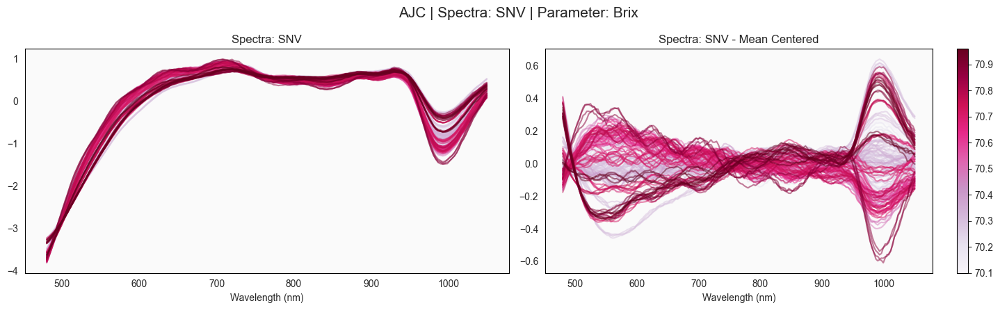

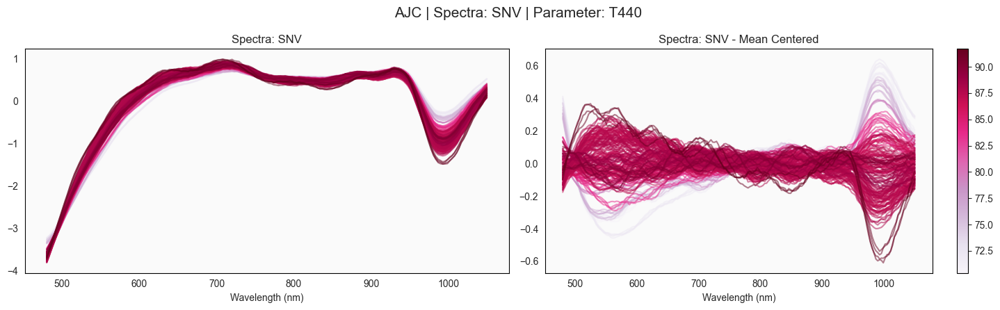

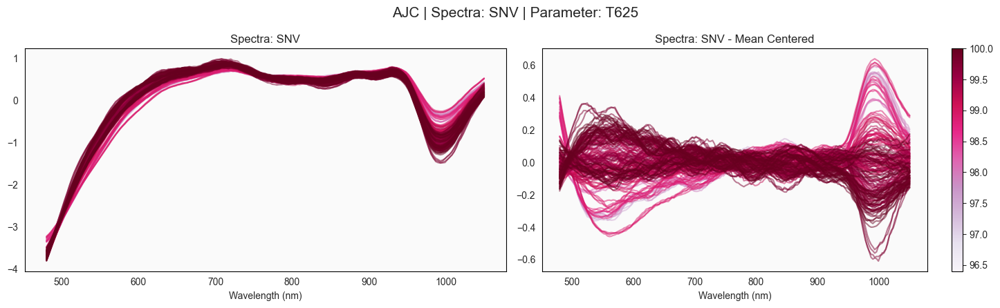

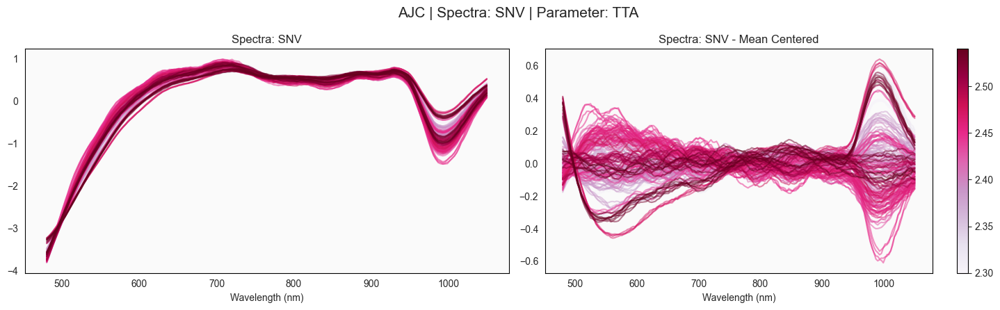

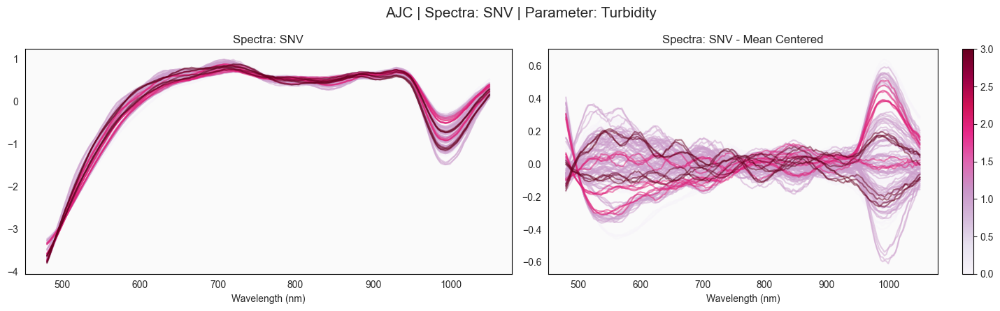

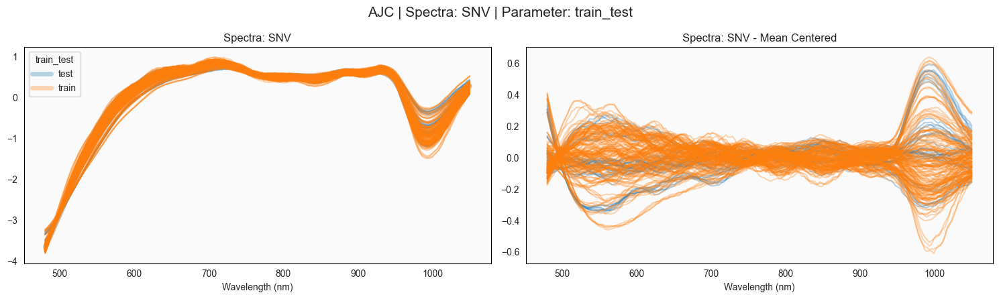

In [28]:
for selection in selections:

    output_dir = Path(f"../data/visualisation/{selection}/{PREPROCESSING}")
    output_dir.mkdir(exist_ok=True, parents=True)

    SAMPLE_TYPE = f'{selection}'

    for split in data_split:
        key = f'{selection}_{split}'
        if key in cleaned_spectra:
            if split == 'spectra':
                selected_df = cleaned_spectra[key]
            elif split == 'label':
                selected_labels = cleaned_spectra[key]
            print(f'Assigned {key} to {split}_df')

    snv_df = pd.DataFrame(SNV().fit_transform(selected_df), columns=selected_df.columns, index=selected_df.index)
    plot_df = snv_df.copy()

    spectra_meta = {
        **spectra_meta,
        f'{selection}_plot_df' : plot_df
    }

    for param, label_type in param_label_map.items():
        plot_spectra(plot_df, labels=selected_labels[[param]],
                    label_type=label_type,
                    spec_prep=PREPROCESSING,
                    sample_type=SAMPLE_TYPE,
                    cmap=cmap)
        
        plt.savefig(output_dir / f"{selection}_spectra_{param}.png", bbox_inches='tight')

        plt.show()
        plt.close()

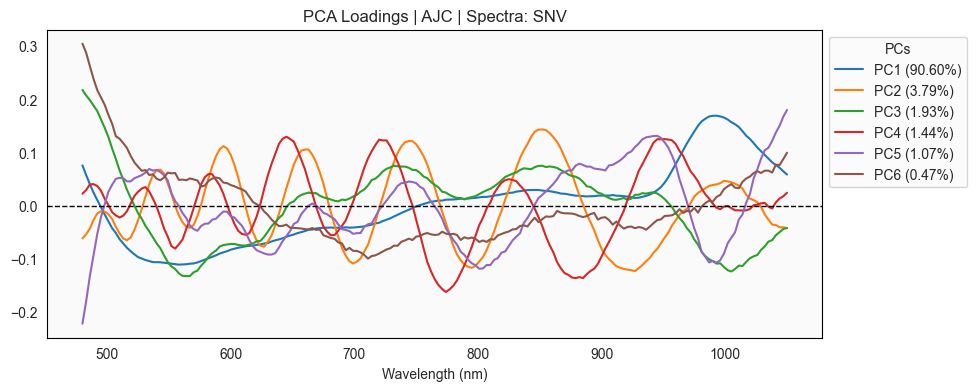

Total Explained Variance: 99.297% 
    Number of Components: 6


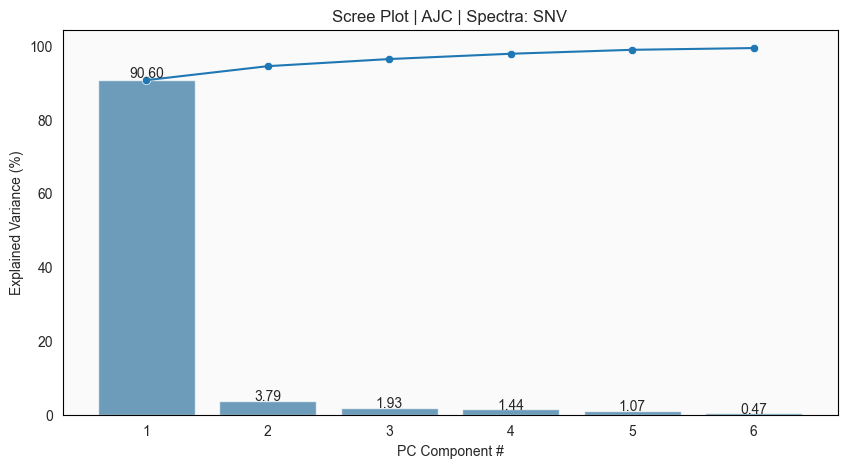

In [29]:
N_COMP = 0.99
RANDOM_STATE = 42

for selection in selections:

    output_dir = Path(f"../data/visualisation/{selection}/{PREPROCESSING}")
    output_dir.mkdir(exist_ok=True, parents=True)
    
    SAMPLE_TYPE = f'{selection}'

    plot_df = spectra_meta[f'{selection}_plot_df']

    fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)

    spectra_meta = {
        **spectra_meta,
        f'{selection}_fitted_pc' : fitted_pc,
        f'{selection}_pc_labels' : pc_labels,
        }

    fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
                            spec_prep=PREPROCESSING, 
                            sample_type=SAMPLE_TYPE)
    
    plt.savefig(output_dir / f"{selection}_pca_loadings.png", bbox_inches='tight')
    plt.show()
    plt.close()

    fig1, ax1 = plot_scree(fitted_pc,
                        spec_prep=PREPROCESSING, 
                        sample_type=SAMPLE_TYPE)
    print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
    Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

    plt.savefig(output_dir / f"{selection}_scree_plot.png", bbox_inches='tight')
    plt.show()
    plt.close()

Assigned AJC_spectra to spectra_df
Assigned AJC_label to label_df
(200, 191) (200, 6)


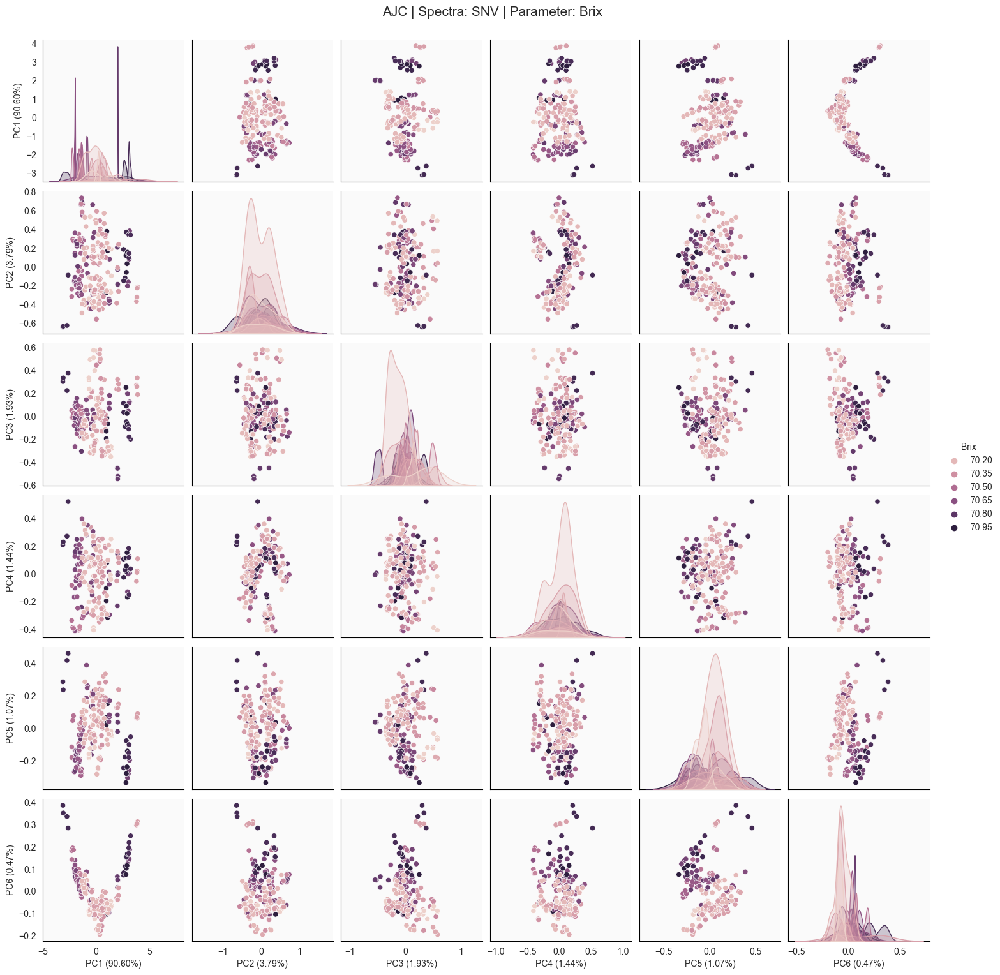

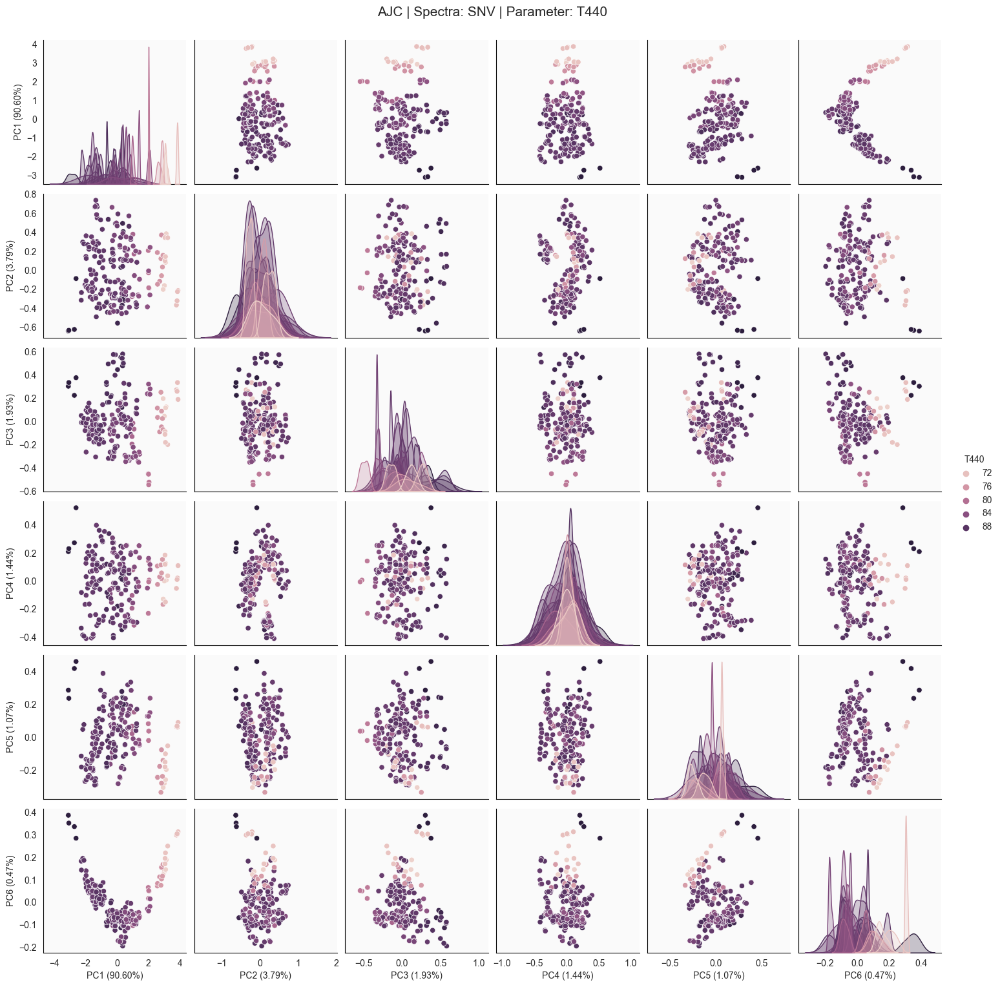

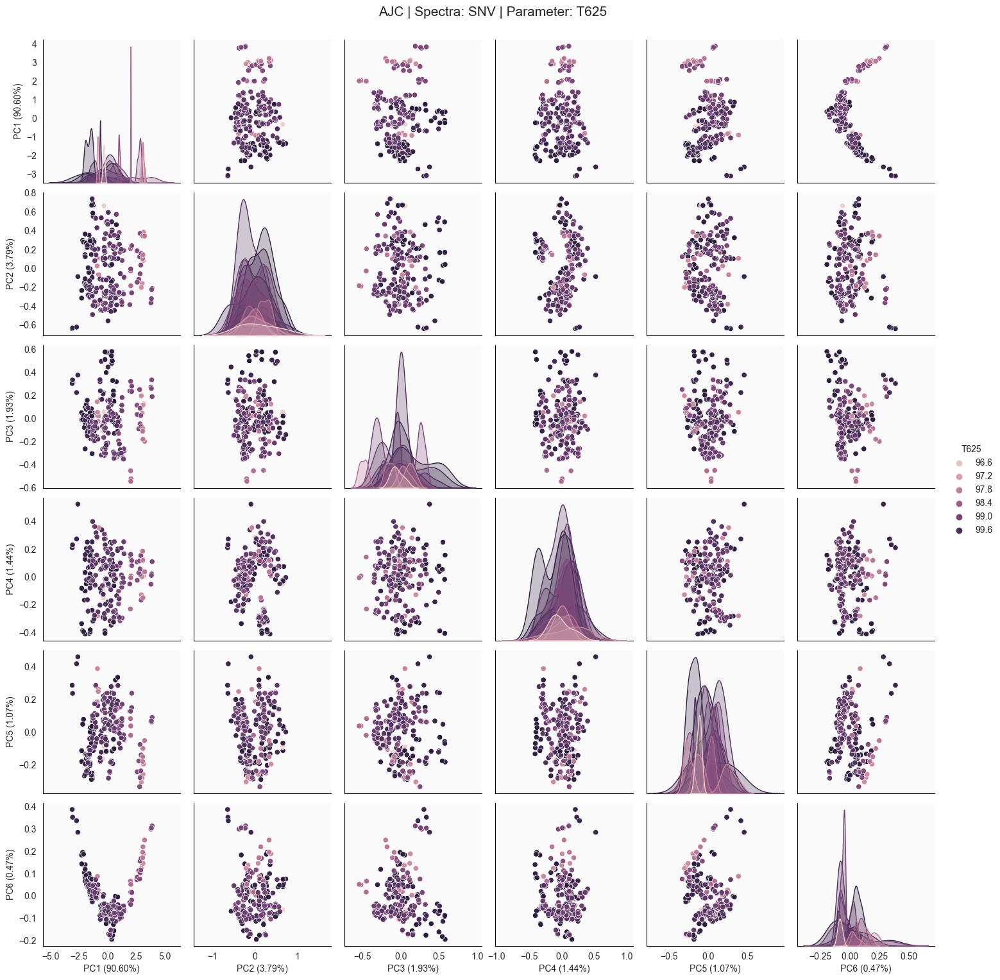

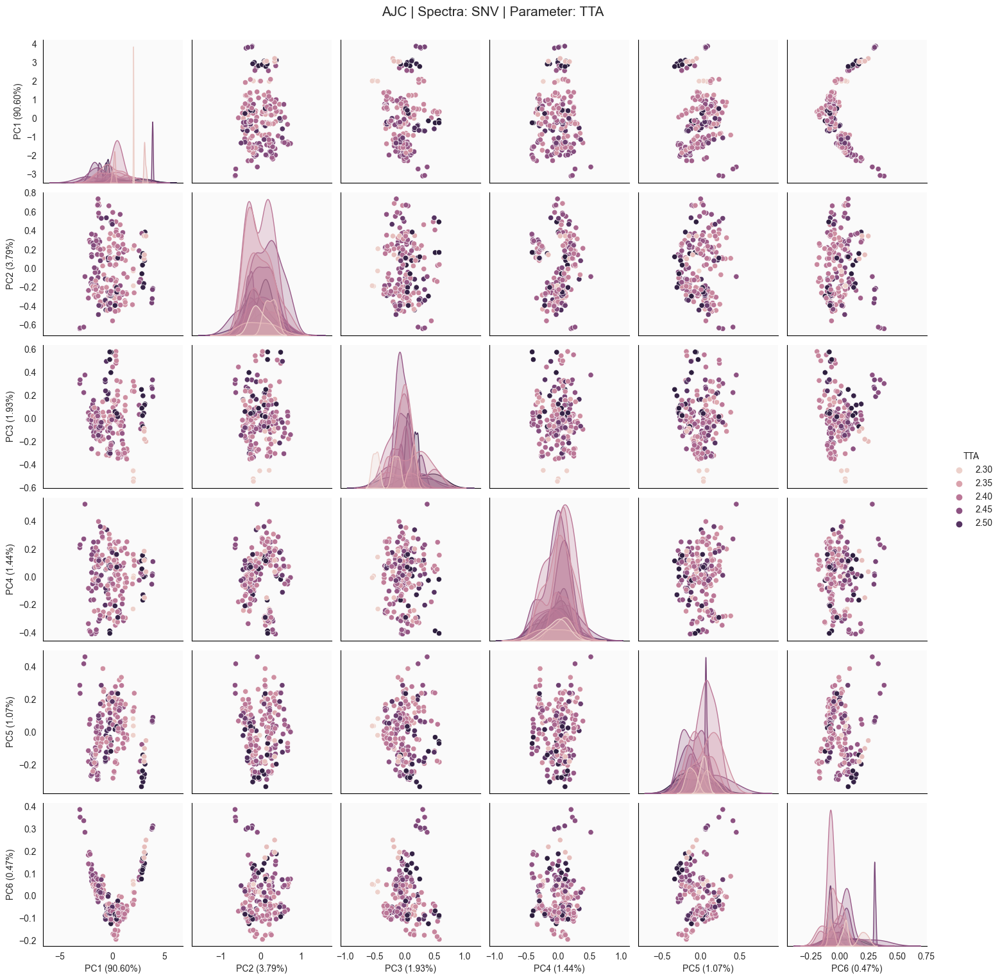

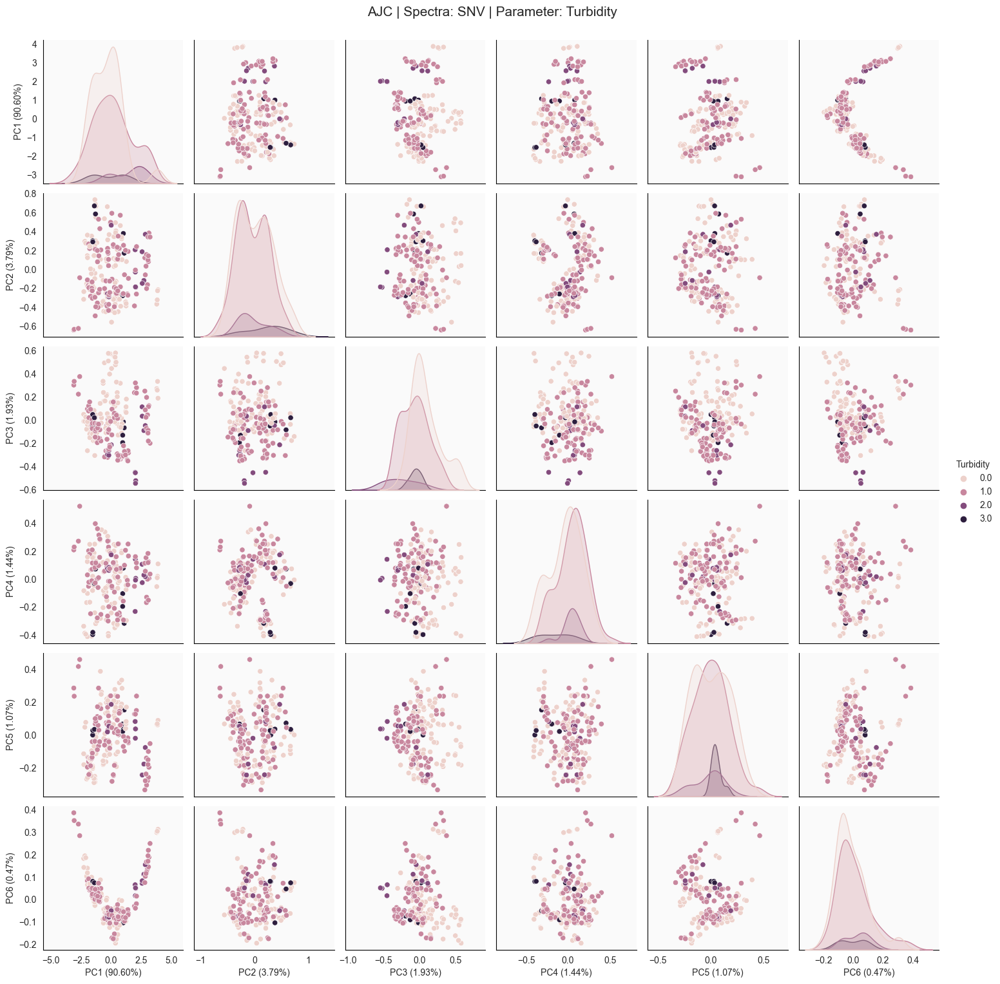

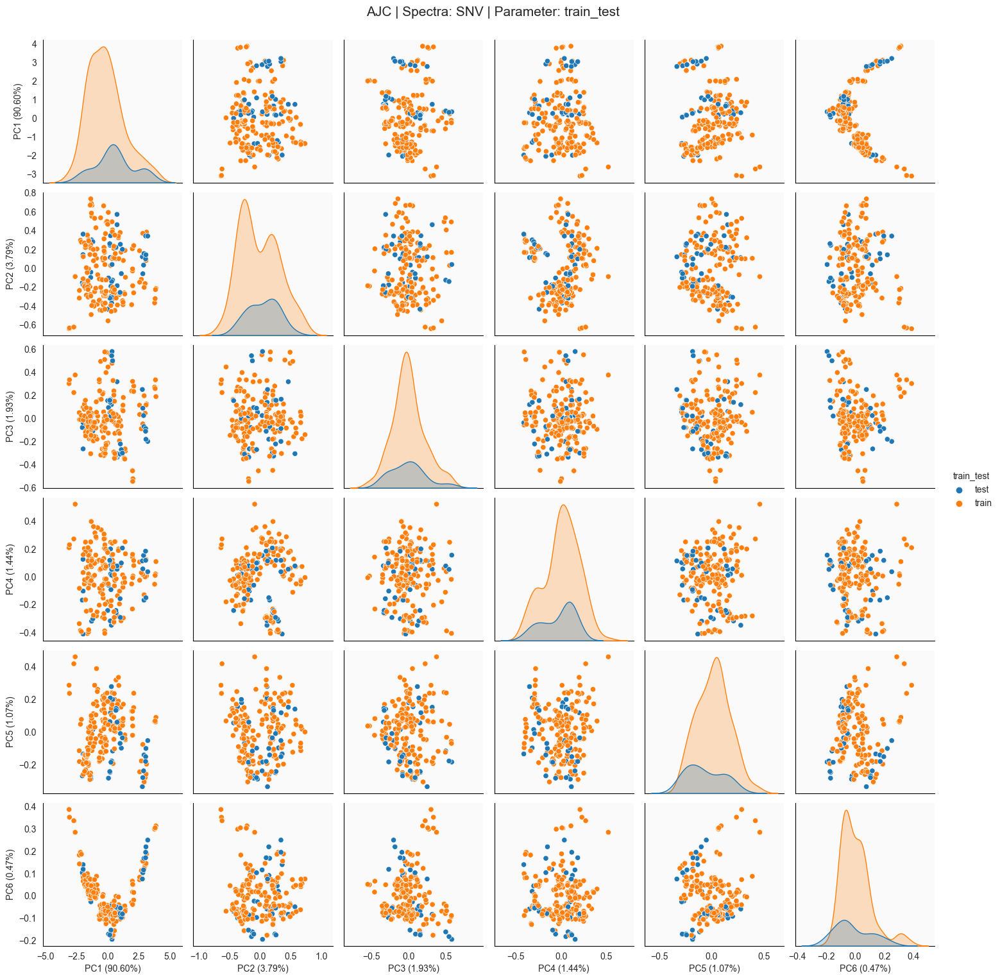

In [30]:
for selection in selections:

    output_dir = Path(f"../data/visualisation/{selection}/{PREPROCESSING}")
    output_dir.mkdir(exist_ok=True, parents=True)

    SAMPLE_TYPE = f'{selection}'

    for split in data_split:
        key = f'{selection}_{split}'
        if key in cleaned_spectra:
            if split == 'spectra':
                selected_df = cleaned_spectra[key]
            elif split == 'label':
                selected_labels = cleaned_spectra[key]
            print(f'Assigned {key} to {split}_df')
    
    plot_df = spectra_meta[f'{selection}_plot_df']
    fitted_pc = spectra_meta[f'{selection}_fitted_pc']
    pc_labels = spectra_meta[f'{selection}_pc_labels']

    ### masking for investigation

    masking = [
        'no',
        # 'farm',
        # 'pct'
        ]

    if masking == ['no']:
        print(plot_df.shape, selected_labels.shape)

        for param in param_label_map.keys():
            pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=selected_labels[[param]])
            sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
            plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

            plt.savefig(output_dir / f"{selection}_pca_{param}.png", bbox_inches='tight')
            plt.show()
            plt.close()

    elif masking == ['farm']:

        farms = [
            # 'PNG', 
            'LPG', 
            # 'SBM'
            ]

        for farm in farms:
            mask = (selected_labels['Farm'] == farm)
            plot_df_mask = plot_df.loc[mask,:]
            selected_labels_mask = selected_labels.loc[mask,:]

            print(plot_df_mask.shape, selected_labels_mask.shape)

            for param in param_label_map.keys():
                pc_df = generate_pc_df(plot_df_mask, fitted_pc, pc_labels, labels=selected_labels_mask[[param]])
                sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
                plt.suptitle(f'{SAMPLE_TYPE} | {farm} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

                plt.show()
                plt.close()

    elif masking == ['pct']:

        mask = (selected_labels['pct'] == 0)
        plot_df_mask = plot_df.loc[mask,:]
        selected_labels_mask = selected_labels.loc[mask,:]

        print(plot_df_mask.shape, selected_labels_mask.shape)

        for param in param_label_map.keys():
            pc_df = generate_pc_df(plot_df_mask, fitted_pc, pc_labels, labels=selected_labels_mask[[param]])
            sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
            plt.suptitle(f'{SAMPLE_TYPE} | 0 pct | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)
            plt.show()
            plt.close()

In [121]:
# fig = make_subplots(rows=3, cols= 2, 
#                     subplot_titles=['F Test Spectra', 'F Test PCA', 
#                                     'Mutual Info Spectra', 'Mutual Info PCA',
#                                     'Chi2 Spectra', 'Chi2 PCA'],
#                     specs=[[{'secondary_y': True}, {'secondary_y': True}],
#                            [{'secondary_y': False}, {'secondary_y': False}],
#                            [{'secondary_y': True}, {'secondary_y': True}]],
#                     horizontal_spacing=0.15,
#                     vertical_spacing=0.1)

# title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
# colors = px.colors.qualitative.Plotly
# pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
# n_comp = fitted_pc.n_components_

# for i, param in enumerate(param_label_map.keys()):
#     try:
#         f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
#         f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
#         mms = MinMaxScaler()
#         scaled_spec = mms.fit_transform(plot_df)
#         scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
#         mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
#         mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
#         chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
#         chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
#                        opacity=0.8, showlegend=False),
#                        secondary_y=False,row=2, col=1)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
#                        showlegend=False, opacity=0.8),
#                     secondary_y=False, row=2, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=2)
        
#     except:
#         pass

# # Add figure title
# fig.update_layout(title_text=title, height=1400, width=1400)
# fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
# fig.update_xaxes(title_text="No. of PCs", col=2)

# # Set y-axes titles
# fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
# fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
# fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

# fig.show()

# Detrend

In [33]:
# # CONFIGS
# msc = Detrend()
# msc_df = pd.DataFrame(msc.fit_transform(raw_df), columns=raw_df.columns, index=raw_df.index)
# plot_df = msc_df.copy()
# PREPROCESSING = 'Detrend'

In [34]:
# for param, label_type in param_label_map.items():
#     plot_spectra(plot_df, labels=label_df[[param]],
#                  label_type=label_type,
#                  spec_prep=PREPROCESSING,
#                  sample_type=SAMPLE_TYPE,
#                  cmap=cmap)

In [35]:
# N_COMP = 0.99
# RANDOM_STATE = 42

# fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)
# fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
#                           spec_prep=PREPROCESSING, 
#                           sample_type=SAMPLE_TYPE)
# fig1, ax1 = plot_scree(fitted_pc,
#                        spec_prep=PREPROCESSING, 
#                        sample_type=SAMPLE_TYPE)
# print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
# Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

In [36]:
# for param in param_label_map.keys():
#     pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df[[param]])
#     sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
#     plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

In [37]:
# fig = make_subplots(rows=3, cols= 2, 
#                     subplot_titles=['F Test Spectra', 'F Test PCA', 
#                                     'Mutual Info Spectra', 'Mutual Info PCA',
#                                     'Chi2 Spectra', 'Chi2 PCA'],
#                     specs=[[{'secondary_y': True}, {'secondary_y': True}],
#                            [{'secondary_y': False}, {'secondary_y': False}],
#                            [{'secondary_y': True}, {'secondary_y': True}]],
#                     horizontal_spacing=0.15,
#                     vertical_spacing=0.1)

# title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
# colors = px.colors.qualitative.Plotly
# pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
# n_comp = fitted_pc.n_components_

# for i, param in enumerate(param_label_map.keys()):
#     try:
#         f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
#         f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
#         mms = MinMaxScaler()
#         scaled_spec = mms.fit_transform(plot_df)
#         scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
#         mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
#         mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
#         chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
#         chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
#                        opacity=0.8, showlegend=False),
#                        secondary_y=False,row=2, col=1)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
#                        showlegend=False, opacity=0.8),
#                     secondary_y=False, row=2, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=2)
        
#     except:
#         pass

# # Add figure title
# fig.update_layout(title_text=title, height=1400, width=1400)
# fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
# fig.update_xaxes(title_text="No. of PCs", col=2)

# # Set y-axes titles
# fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
# fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
# fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

# fig.show()

# SNV-Detrend

In [38]:
# # CONFIGS
# snv_df = pd.DataFrame(Detrend().fit_transform(SNV().fit_transform(raw_df)), columns=raw_df.columns, index=raw_df.index)
# plot_df = snv_df.copy()
# PREPROCESSING = 'SNV-Detrend'

In [39]:
# for param, label_type in param_label_map.items():
#     plot_spectra(plot_df, labels=label_df[[param]],
#                  label_type=label_type,
#                  spec_prep=PREPROCESSING,
#                  sample_type=SAMPLE_TYPE,
#                  cmap=cmap)

In [40]:
# N_COMP = 0.99
# RANDOM_STATE = 42

# fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)
# fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
#                           spec_prep=PREPROCESSING, 
#                           sample_type=SAMPLE_TYPE)
# fig1, ax1 = plot_scree(fitted_pc,
#                        spec_prep=PREPROCESSING, 
#                        sample_type=SAMPLE_TYPE)
# print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
# Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

In [41]:
# for param in param_label_map.keys():
#     pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df[[param]])
#     sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
#     plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

In [42]:
# fig = make_subplots(rows=3, cols= 2, 
#                     subplot_titles=['F Test Spectra', 'F Test PCA', 
#                                     'Mutual Info Spectra', 'Mutual Info PCA',
#                                     'Chi2 Spectra', 'Chi2 PCA'],
#                     specs=[[{'secondary_y': True}, {'secondary_y': True}],
#                            [{'secondary_y': False}, {'secondary_y': False}],
#                            [{'secondary_y': True}, {'secondary_y': True}]],
#                     horizontal_spacing=0.15,
#                     vertical_spacing=0.1)

# title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
# colors = px.colors.qualitative.Plotly
# pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
# n_comp = fitted_pc.n_components_

# for i, param in enumerate(param_label_map.keys()):
#     try:
#         f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
#         f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
#         mms = MinMaxScaler()
#         scaled_spec = mms.fit_transform(plot_df)
#         scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
#         mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
#         mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
#         chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
#         chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
#                        opacity=0.8, showlegend=False),
#                        secondary_y=False,row=2, col=1)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
#                        showlegend=False, opacity=0.8),
#                     secondary_y=False, row=2, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=2)
        
#     except:
#         pass

# # Add figure title
# fig.update_layout(title_text=title, height=1400, width=1400)
# fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
# fig.update_xaxes(title_text="No. of PCs", col=2)

# # Set y-axes titles
# fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
# fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
# fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

# fig.show()

# SG1D9W2P

In [31]:
# CONFIGS
PREPROCESSING = 'SG1D9W2P'
spectra_meta = {}

Assigned AJC_spectra to spectra_df
Assigned AJC_label to label_df


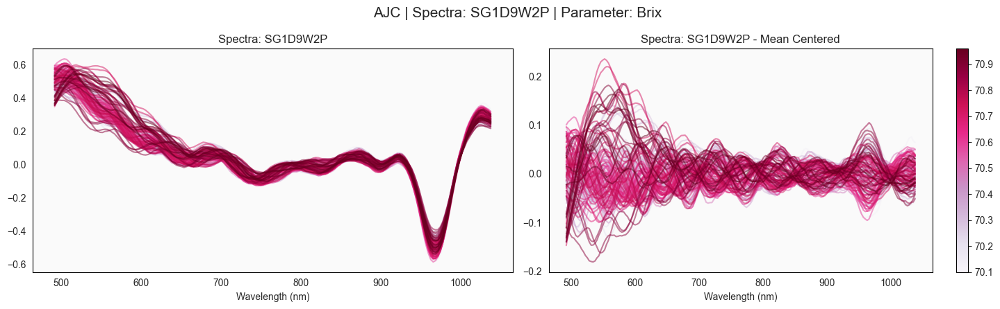

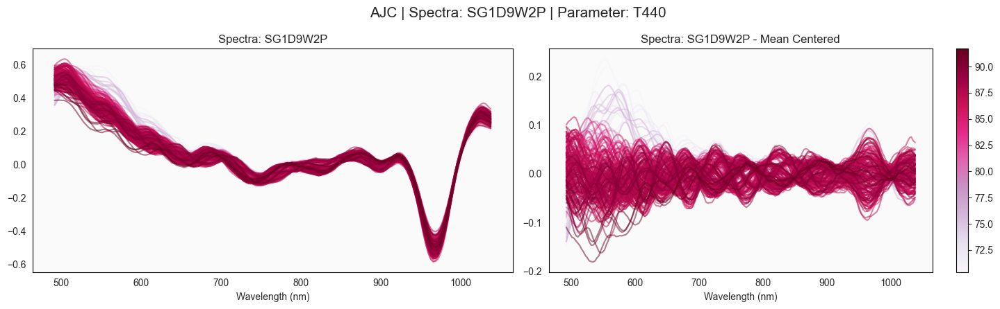

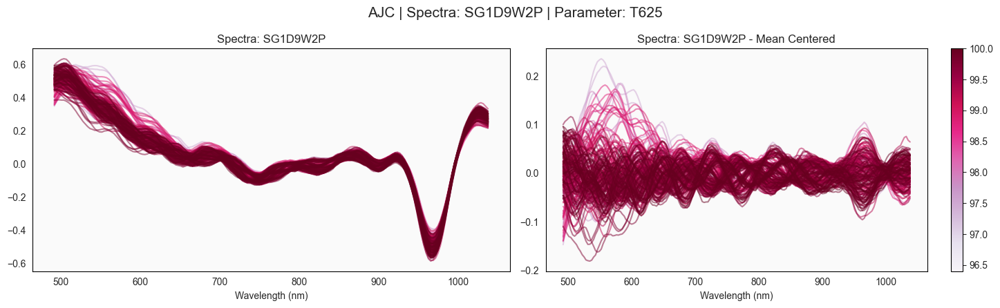

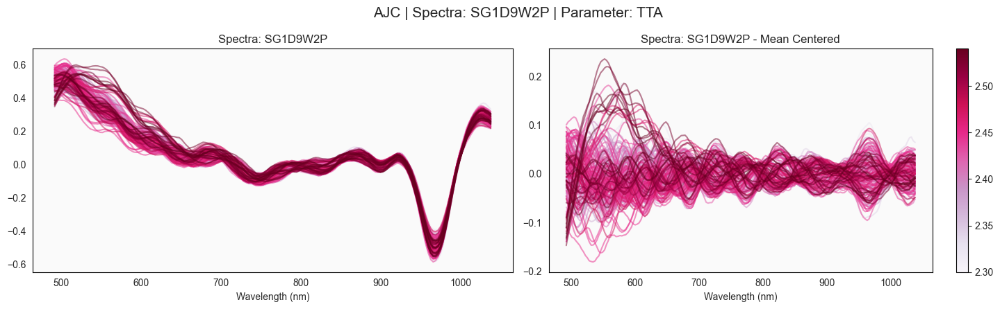

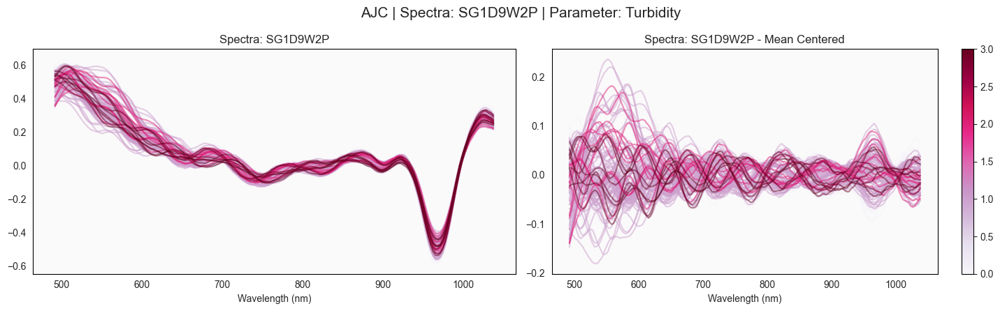

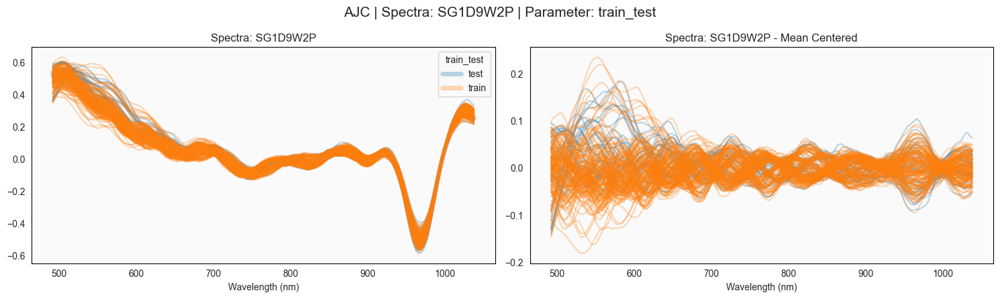

In [32]:
for selection in selections:

    output_dir = Path(f"../data/visualisation/{selection}/{PREPROCESSING}")
    output_dir.mkdir(exist_ok=True, parents=True)

    SAMPLE_TYPE = f'{selection}'
    
    for split in data_split:
        key = f'{selection}_{split}'
        if key in cleaned_spectra:
            if split == 'spectra':
                selected_df = cleaned_spectra[key]
            elif split == 'label':
                selected_labels = cleaned_spectra[key]
            print(f'Assigned {key} to {split}_df')

    msc = SavitzkyGolay(deriv=1, window=9, polyorder=2)
    msc_df = pd.DataFrame(msc.fit_transform(selected_df), 
                        columns=selected_df.columns[4:-4], index=selected_df.index)
    plot_df = msc_df.copy()

    spectra_meta = {
        **spectra_meta,
        f'{selection}_plot_df' : plot_df
    }

    for param, label_type in param_label_map.items():
        plot_spectra(plot_df, labels=selected_labels[[param]],
                    label_type=label_type,
                    spec_prep=PREPROCESSING,
                    sample_type=SAMPLE_TYPE,
                    cmap=cmap)
        
        # plt.savefig(output_dir / f"{selection}_spectra_{param}.png", bbox_inches='tight')

        plt.show()
        plt.close()

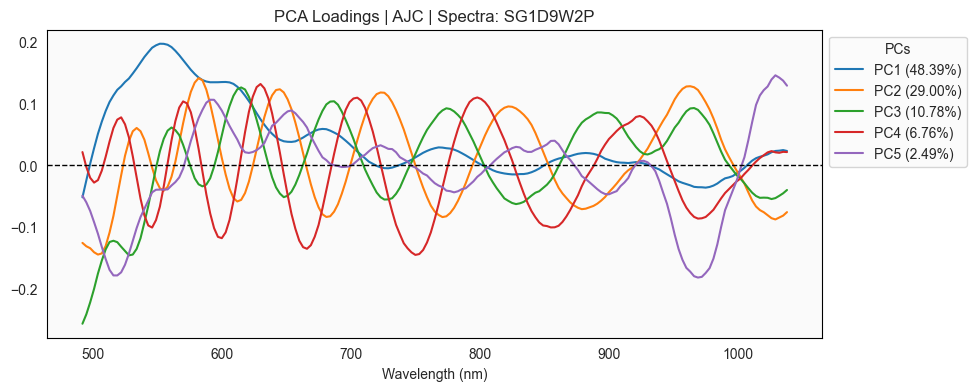

Total Explained Variance: 97.428% 
    Number of Components: 5


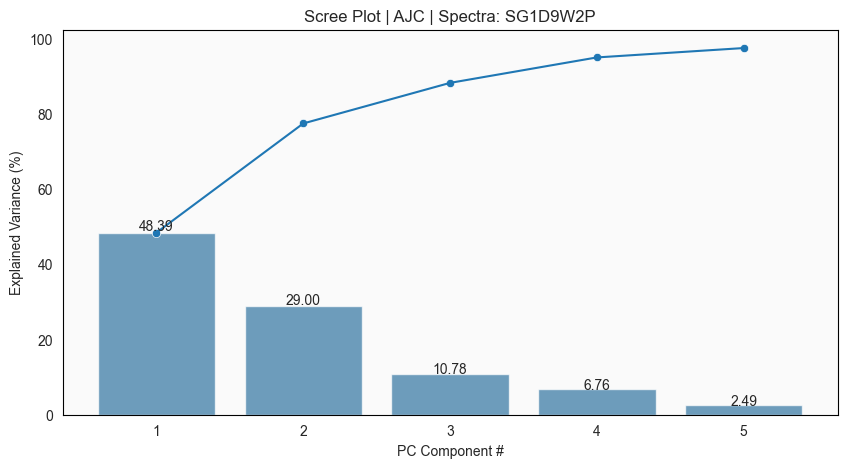

In [33]:
N_COMP = 0.95
RANDOM_STATE = 42

for selection in selections:

    output_dir = Path(f"../data/visualisation/{selection}/{PREPROCESSING}")
    output_dir.mkdir(exist_ok=True, parents=True)

    SAMPLE_TYPE = f'{selection}'

    plot_df = spectra_meta[f'{selection}_plot_df']

    fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)

    spectra_meta = {
        **spectra_meta,
        f'{selection}_fitted_pc' : fitted_pc,
        f'{selection}_pc_labels' : pc_labels,
        }

    fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
                            spec_prep=PREPROCESSING, 
                            sample_type=SAMPLE_TYPE)
    
    plt.savefig(output_dir / f"{selection}_pca_loadings.png", bbox_inches='tight')
    plt.show()
    plt.close()

    fig1, ax1 = plot_scree(fitted_pc,
                        spec_prep=PREPROCESSING, 
                        sample_type=SAMPLE_TYPE)
    print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
    Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

    plt.savefig(output_dir / f"{selection}_scree_plot.png", bbox_inches='tight')
    plt.show()
    plt.close()

Assigned AJC_spectra to spectra_df
Assigned AJC_label to label_df
(200, 183) (200, 6)


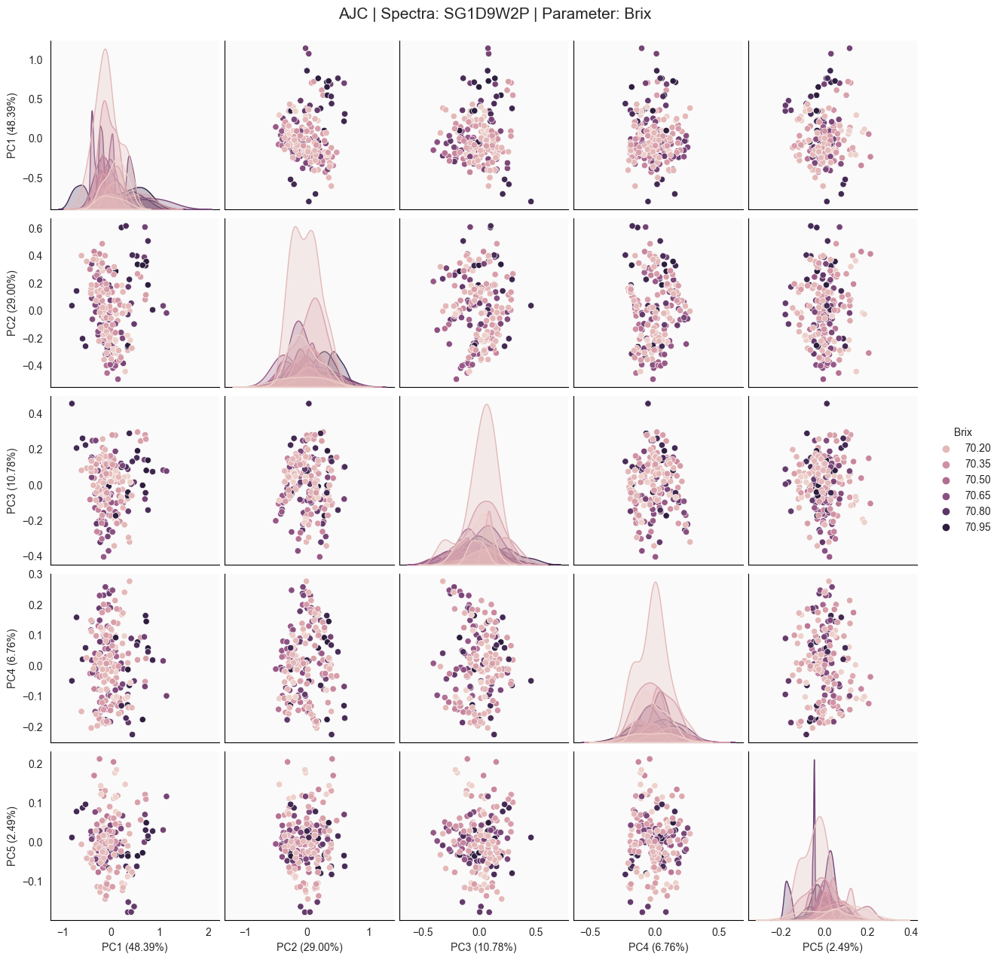

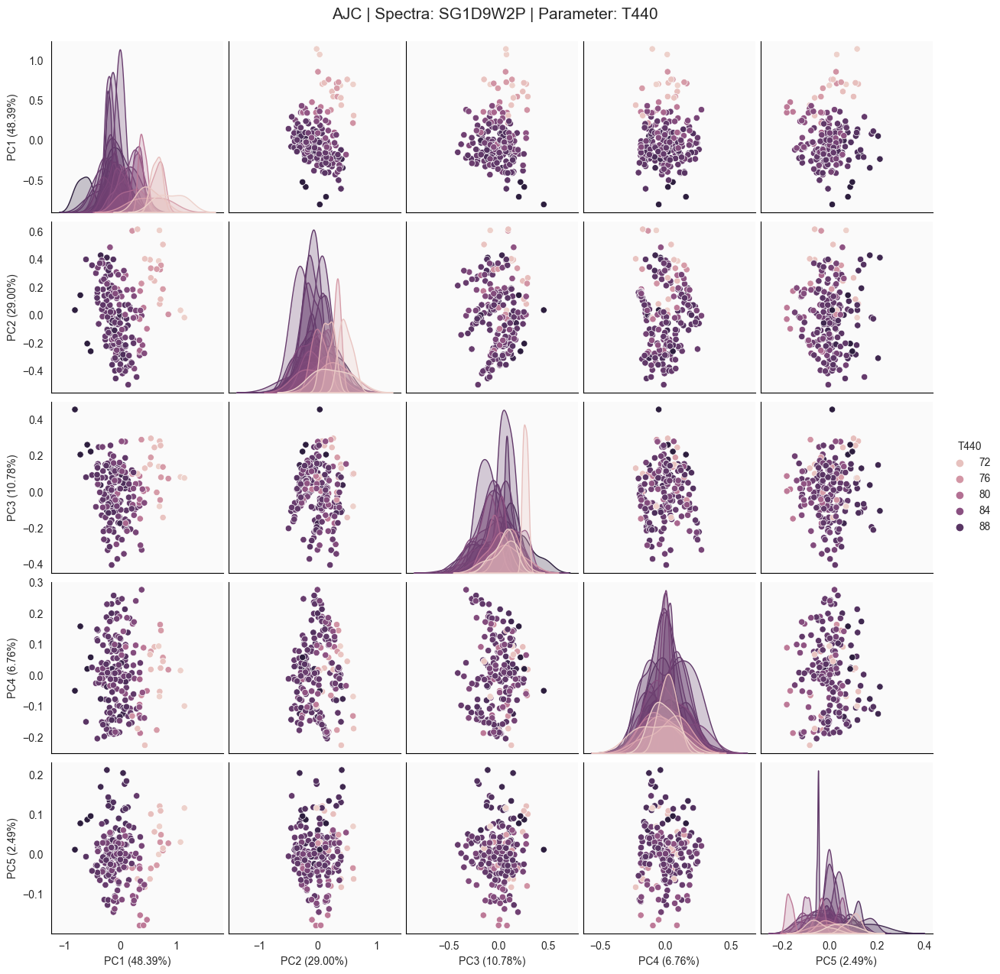

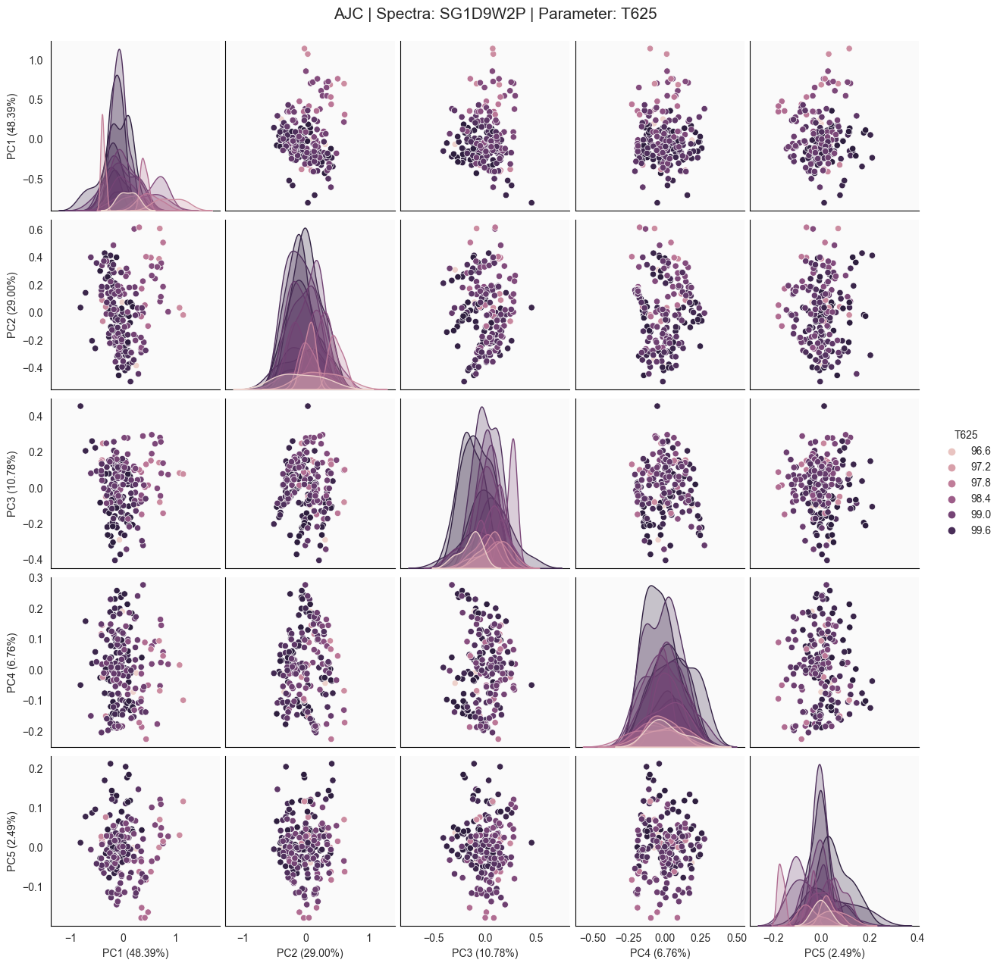

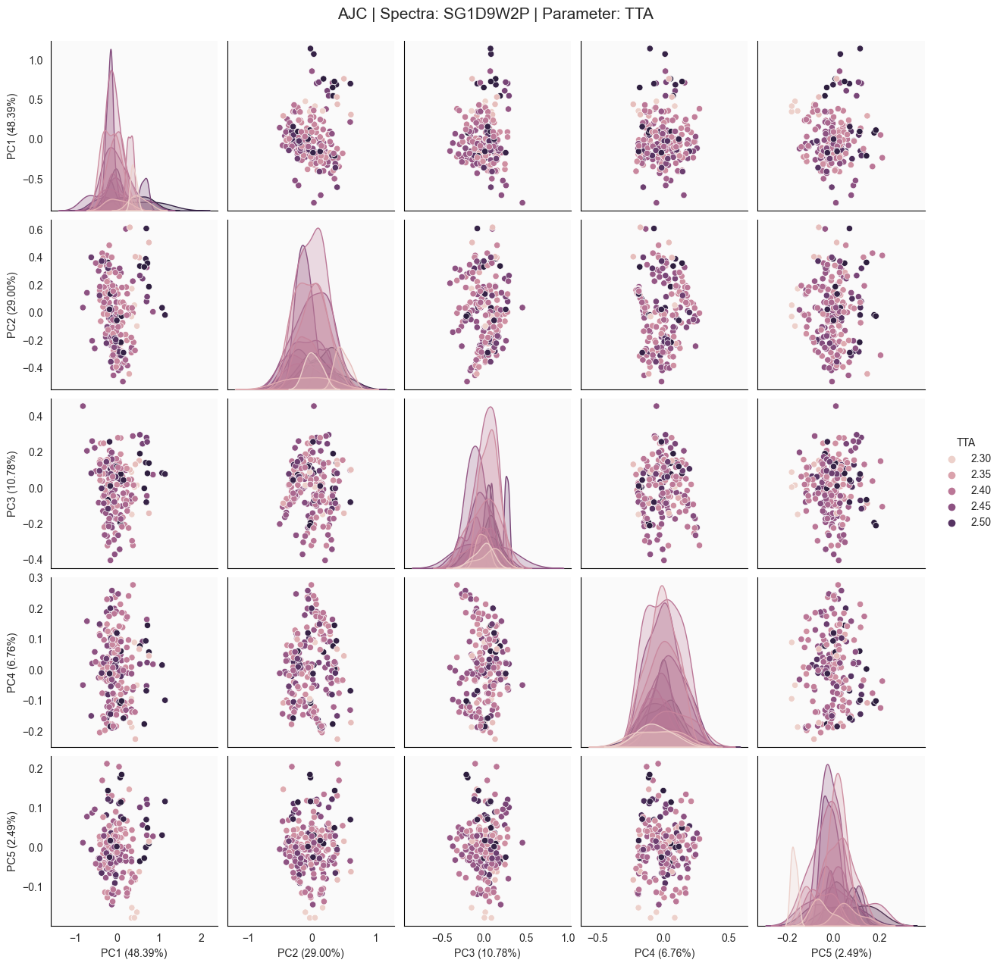

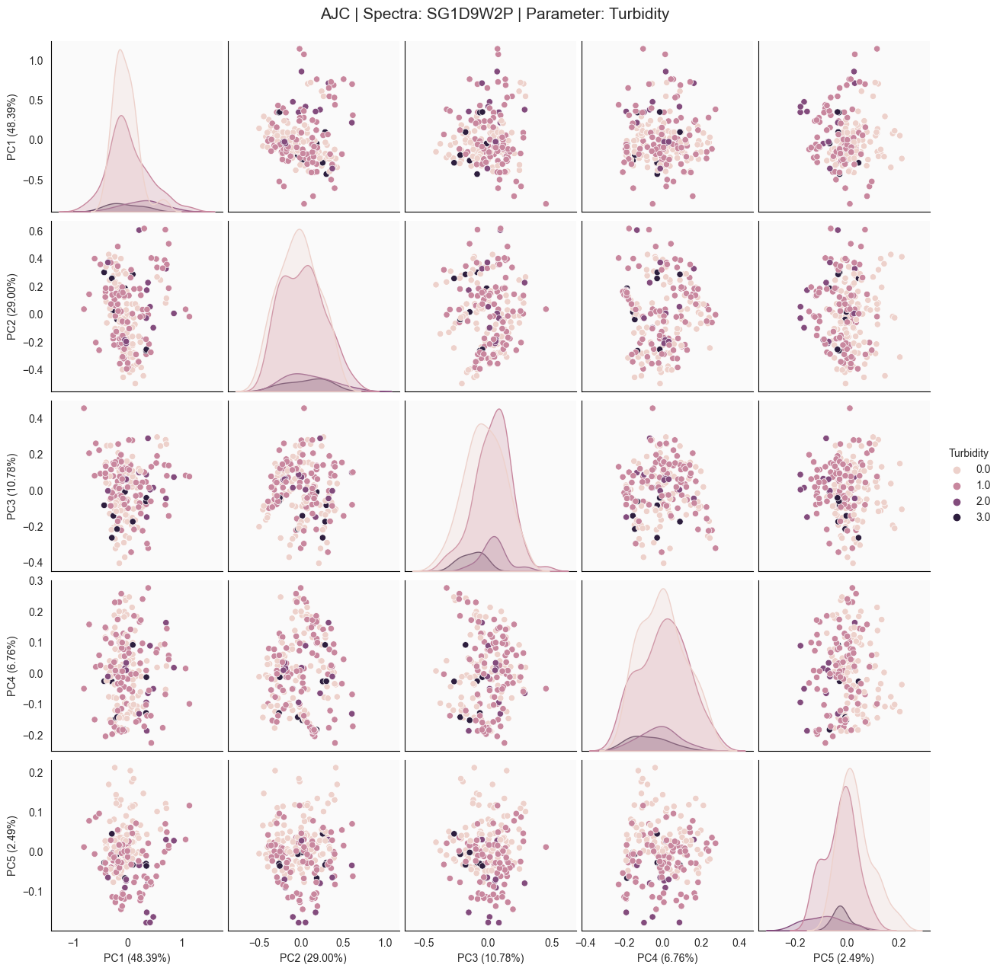

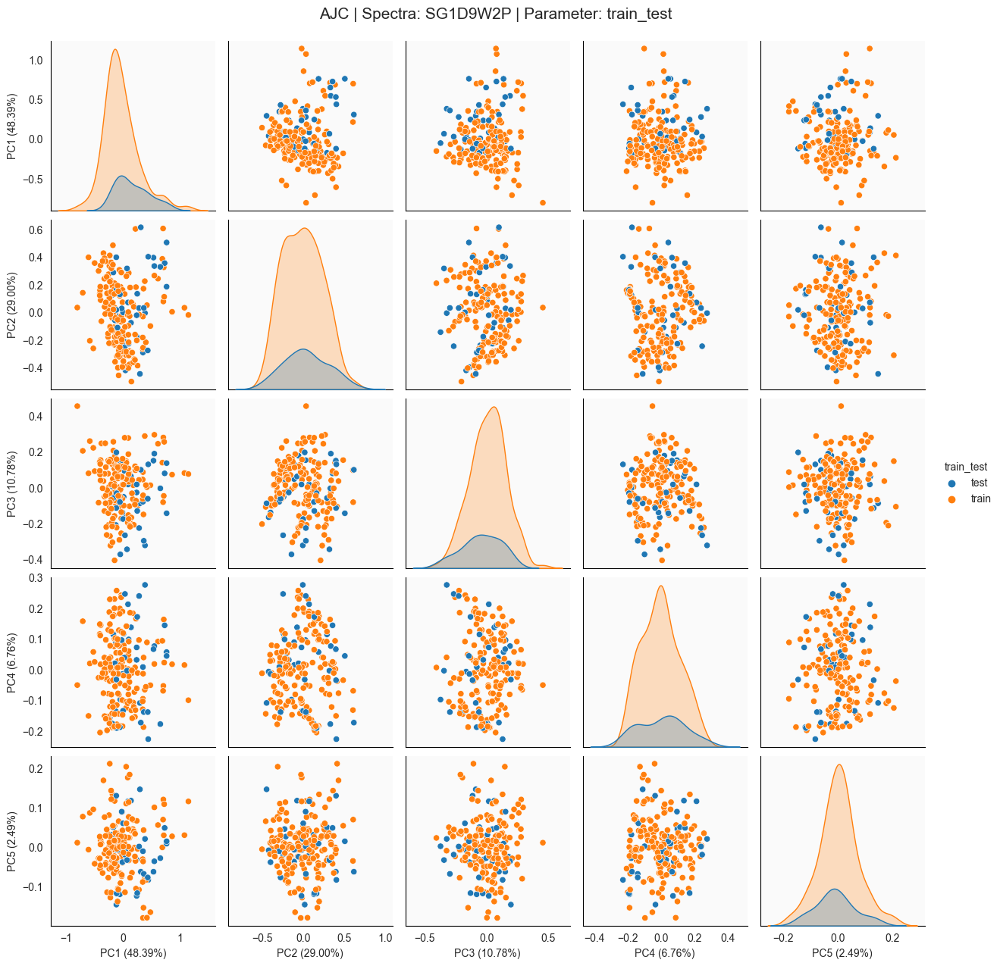

In [34]:
for selection in selections:

    output_dir = Path(f"../data/visualisation/{selection}/{PREPROCESSING}")
    output_dir.mkdir(exist_ok=True, parents=True)

    SAMPLE_TYPE = f'{selection}'

    for split in data_split:
        key = f'{selection}_{split}'
        if key in cleaned_spectra:
            if split == 'spectra':
                selected_df = cleaned_spectra[key]
            elif split == 'label':
                selected_labels = cleaned_spectra[key]
            print(f'Assigned {key} to {split}_df')
    
    plot_df = spectra_meta[f'{selection}_plot_df']
    fitted_pc = spectra_meta[f'{selection}_fitted_pc']
    pc_labels = spectra_meta[f'{selection}_pc_labels']

    ### masking for investigation

    masking = [
        'no',
        # 'farm',
        # 'pct'
        ]

    if masking==['no']:
        print(plot_df.shape, selected_labels.shape)

        for param in param_label_map.keys():
            pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=selected_labels[[param]])
            sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
            plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

            plt.savefig(output_dir / f"{selection}_pca_{param}.png", bbox_inches='tight')
            plt.show()
            plt.close()

    elif masking==['farm']:

        farms = [
            # 'PNG', 
            'LPG', 
            # 'SBM'
            ]

        for farm in farms:
            mask = (selected_labels['Farm'] == farm)
            plot_df_mask = plot_df.loc[mask,:]
            selected_labels_mask = selected_labels.loc[mask,:]

            print(plot_df_mask.shape, selected_labels_mask.shape)

            for param in param_label_map.keys():
                pc_df = generate_pc_df(plot_df_mask, fitted_pc, pc_labels, labels=selected_labels_mask[[param]])
                sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
                plt.suptitle(f'{SAMPLE_TYPE} | {farm} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)
                plt.show()
                plt.close()

    elif masking==['pct']:

        mask = (selected_labels['pct'] == 0)
        plot_df_mask = plot_df.loc[mask,:]
        selected_labels_mask = selected_labels.loc[mask,:]

        print(plot_df_mask.shape, selected_labels_mask.shape)

        for param in param_label_map.keys():
            pc_df = generate_pc_df(plot_df_mask, fitted_pc, pc_labels, labels=selected_labels_mask[[param]])
            sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
            plt.suptitle(f'{SAMPLE_TYPE} | 0 pct | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)
            plt.show()
            plt.close()

In [45]:
# fig = make_subplots(rows=3, cols= 2, 
#                     subplot_titles=['F Test Spectra', 'F Test PCA', 
#                                     'Mutual Info Spectra', 'Mutual Info PCA',
#                                     'Chi2 Spectra', 'Chi2 PCA'],
#                     specs=[[{'secondary_y': True}, {'secondary_y': True}],
#                            [{'secondary_y': False}, {'secondary_y': False}],
#                            [{'secondary_y': True}, {'secondary_y': True}]],
#                     horizontal_spacing=0.15,
#                     vertical_spacing=0.1)

# title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
# colors = px.colors.qualitative.Plotly
# pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
# n_comp = fitted_pc.n_components_

# for i, param in enumerate(param_label_map.keys()):
#     try:
#         f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
#         f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
#         mms = MinMaxScaler()
#         scaled_spec = mms.fit_transform(plot_df)
#         scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
#         mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
#         mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
#         chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
#         chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
#                        opacity=0.8, showlegend=False),
#                        secondary_y=False,row=2, col=1)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
#                        showlegend=False, opacity=0.8),
#                     secondary_y=False, row=2, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=2)
        
#     except:
#         pass

# # Add figure title
# fig.update_layout(title_text=title, height=1400, width=1400)
# fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
# fig.update_xaxes(title_text="No. of PCs", col=2)

# # Set y-axes titles
# fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
# fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
# fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

# fig.show()

# SNV-SG1D9W2P

In [ ]:
# # CONFIGS
# msc = SavitzkyGolay(deriv=1, window=9, polyorder=2)
# msc_df = pd.DataFrame(msc.fit_transform(SNV().fit_transform(raw_df)), 
#                       columns=raw_df.columns[4:-4], index=raw_df.index)
# plot_df = msc_df.copy()
# PREPROCESSING = 'SNV-SG1D4W2P'

In [ ]:
# for param, label_type in param_label_map.items():
#     plot_spectra(plot_df, labels=label_df[[param]],
#                  label_type=label_type,
#                  spec_prep=PREPROCESSING,
#                  sample_type=SAMPLE_TYPE,
#                  cmap=cmap)

In [ ]:
# N_COMP = 0.95
# RANDOM_STATE = 42

# fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)
# fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
#                           spec_prep=PREPROCESSING, 
#                           sample_type=SAMPLE_TYPE)
# fig1, ax1 = plot_scree(fitted_pc,
#                        spec_prep=PREPROCESSING, 
#                        sample_type=SAMPLE_TYPE)
# print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
# Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

In [ ]:
# for param in param_label_map.keys():
#     pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df[[param]])
#     sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
#     plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

In [ ]:
# fig = make_subplots(rows=3, cols= 2, 
#                     subplot_titles=['F Test Spectra', 'F Test PCA', 
#                                     'Mutual Info Spectra', 'Mutual Info PCA',
#                                     'Chi2 Spectra', 'Chi2 PCA'],
#                     specs=[[{'secondary_y': True}, {'secondary_y': True}],
#                            [{'secondary_y': False}, {'secondary_y': False}],
#                            [{'secondary_y': True}, {'secondary_y': True}]],
#                     horizontal_spacing=0.15,
#                     vertical_spacing=0.1)

# title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
# colors = px.colors.qualitative.Plotly
# pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
# n_comp = fitted_pc.n_components_

# for i, param in enumerate(param_label_map.keys()):
#     try:
#         f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
#         f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
#         mms = MinMaxScaler()
#         scaled_spec = mms.fit_transform(plot_df)
#         scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
#         mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
#         mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
#         chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
#         chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
#                        opacity=0.8, showlegend=False),
#                        secondary_y=False,row=2, col=1)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
#                        showlegend=False, opacity=0.8),
#                     secondary_y=False, row=2, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=2)
        
#     except:
#         pass

# # Add figure title
# fig.update_layout(title_text=title, height=1400, width=1400)
# fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
# fig.update_xaxes(title_text="No. of PCs", col=2)

# # Set y-axes titles
# fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
# fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
# fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

# fig.show()

# SG2D9W2P

In [ ]:
# CONFIGS
PREPROCESSING = 'SG2D9W2P'
spectra_meta = {}

In [ ]:
for selection in selections:
    SAMPLE_TYPE = f'{selection}'
    
    for split in data_split:
        key = f'{selection}_{split}'
        if key in cleaned_spectra:
            if split == 'spectra':
                selected_df = cleaned_spectra[key]
            elif split == 'label':
                selected_labels = cleaned_spectra[key]
            print(f'Assigned {key} to {split}_df')

    msc = SavitzkyGolay(deriv=2, window=9, polyorder=2)
    msc_df = pd.DataFrame(msc.fit_transform(selected_df), 
                        columns=selected_df.columns[4:-4], index=selected_df.index)
    plot_df = msc_df.copy()

    spectra_meta = {
        **spectra_meta,
        f'{selection}_plot_df' : plot_df
    }

    for param, label_type in param_label_map.items():
        plot_spectra(plot_df, labels=selected_labels[[param]],
                    label_type=label_type,
                    spec_prep=PREPROCESSING,
                    sample_type=SAMPLE_TYPE,
                    cmap=cmap)

In [ ]:
N_COMP = 0.95
RANDOM_STATE = 42

for selection in selections:
    SAMPLE_TYPE = f'{selection}'

    plot_df = spectra_meta[f'{selection}_plot_df']

    fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)

    spectra_meta = {
        **spectra_meta,
        f'{selection}_fitted_pc' : fitted_pc,
        f'{selection}_pc_labels' : pc_labels,
        }

    fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
                            spec_prep=PREPROCESSING, 
                            sample_type=SAMPLE_TYPE)
    fig1, ax1 = plot_scree(fitted_pc,
                        spec_prep=PREPROCESSING, 
                        sample_type=SAMPLE_TYPE)
    print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
    Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

In [ ]:
for selection in selections:
    SAMPLE_TYPE = f'{selection}'

    for split in data_split:
        key = f'{selection}_{split}'
        if key in cleaned_spectra:
            if split == 'spectra':
                selected_df = cleaned_spectra[key]
            elif split == 'label':
                selected_labels = cleaned_spectra[key]
            print(f'Assigned {key} to {split}_df')
    
    plot_df = spectra_meta[f'{selection}_plot_df']
    fitted_pc = spectra_meta[f'{selection}_fitted_pc']
    pc_labels = spectra_meta[f'{selection}_pc_labels']

    for param in param_label_map.keys():
        pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=selected_labels[[param]])
        sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
        plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

In [ ]:
# fig = make_subplots(rows=3, cols= 2, 
#                     subplot_titles=['F Test Spectra', 'F Test PCA', 
#                                     'Mutual Info Spectra', 'Mutual Info PCA',
#                                     'Chi2 Spectra', 'Chi2 PCA'],
#                     specs=[[{'secondary_y': True}, {'secondary_y': True}],
#                            [{'secondary_y': False}, {'secondary_y': False}],
#                            [{'secondary_y': True}, {'secondary_y': True}]],
#                     horizontal_spacing=0.15,
#                     vertical_spacing=0.1)

# title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
# colors = px.colors.qualitative.Plotly
# pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
# n_comp = fitted_pc.n_components_

# for i, param in enumerate(param_label_map.keys()):
#     try:
#         f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
#         f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
#         mms = MinMaxScaler()
#         scaled_spec = mms.fit_transform(plot_df)
#         scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
#         mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
#         mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
#         chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
#         chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
#                        opacity=0.8, showlegend=False),
#                        secondary_y=False,row=2, col=1)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
#                        showlegend=False, opacity=0.8),
#                     secondary_y=False, row=2, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=2)
        
#     except:
#         pass

# # Add figure title
# fig.update_layout(title_text=title, height=1400, width=1400)
# fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
# fig.update_xaxes(title_text="No. of PCs", col=2)

# # Set y-axes titles
# fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
# fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
# fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

# fig.show()

# SNV-SG2D9W2P

In [ ]:
# # CONFIGS
# msc = SavitzkyGolay(deriv=2, window=9, polyorder=2)
# msc_df = pd.DataFrame(msc.fit_transform(SNV().fit_transform(raw_df)), 
#                       columns=raw_df.columns[4:-4], index=raw_df.index)
# plot_df = msc_df.copy()
# PREPROCESSING = 'SNV-SG2D9W2P'

In [ ]:
# for param, label_type in param_label_map.items():
#     plot_spectra(plot_df, labels=label_df[[param]],
#                  label_type=label_type,
#                  spec_prep=PREPROCESSING,
#                  sample_type=SAMPLE_TYPE,
#                  cmap=cmap)

In [ ]:
# N_COMP = 0.93
# RANDOM_STATE = 42

# fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)
# fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
#                           spec_prep=PREPROCESSING, 
#                           sample_type=SAMPLE_TYPE)
# fig1, ax1 = plot_scree(fitted_pc,
#                        spec_prep=PREPROCESSING, 
#                        sample_type=SAMPLE_TYPE)
# print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
# Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

In [ ]:
# for param in param_label_map.keys():
#     pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df[[param]])
#     sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
#     plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

In [ ]:
# fig = make_subplots(rows=3, cols= 2, 
#                     subplot_titles=['F Test Spectra', 'F Test PCA', 
#                                     'Mutual Info Spectra', 'Mutual Info PCA',
#                                     'Chi2 Spectra', 'Chi2 PCA'],
#                     specs=[[{'secondary_y': True}, {'secondary_y': True}],
#                            [{'secondary_y': False}, {'secondary_y': False}],
#                            [{'secondary_y': True}, {'secondary_y': True}]],
#                     horizontal_spacing=0.15,
#                     vertical_spacing=0.1)

# title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
# colors = px.colors.qualitative.Plotly
# pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
# n_comp = fitted_pc.n_components_

# for i, param in enumerate(param_label_map.keys()):
#     try:
#         f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
#         f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
#         mms = MinMaxScaler()
#         scaled_spec = mms.fit_transform(plot_df)
#         scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
#         mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
#         mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
#         chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
#         chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=1, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=1, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
#                        opacity=0.8, showlegend=False),
#                        secondary_y=False,row=2, col=1)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
#                        showlegend=False, opacity=0.8),
#                     secondary_y=False, row=2, col=2)
        
#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=1)

#         fig.add_trace(
#             go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=1)
        
#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
#                        opacity=0.5, showlegend=False),
#                        secondary_y=False,row=3, col=2)

#         fig.add_trace(
#             go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
#                        name=param, marker_color=colors[i]),
#                     secondary_y=True, row=3, col=2)
        
#     except:
#         pass

# # Add figure title
# fig.update_layout(title_text=title, height=1400, width=1400)
# fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
# fig.update_xaxes(title_text="No. of PCs", col=2)

# # Set y-axes titles
# fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
# fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
# fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
# fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

# fig.show()